#### Optimize the data for both 1yr, 10yr surveys for ugrizy. 
    - Restrict attention to only those areas where there's data for all-6 bands. 
    - Within all-band footprint, implement depth masking (no border masking at all), i.e,. mask/discard all pixels with depth<magcut in i-band, and restrict to stats in those pixels for all six bands.

##### For 1yr data, the median depths are renormalized to match the depth achieved with 10% WFD visits since 1yr (=first 365 nights) in minion1016 doesn't contain 10% of total visits.

#### Final result: Out[19] which prints out the stats with the finalized depth cuts.

For skymaps, for a few cuts (vs. without depth cuts), see Out[18].

Added a few diagnostic plots (histogram of galactic latitude + LAMBDA SFD before and after cuts); after Out[19].

In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
import healpy as hp
from collections import OrderedDict
import pandas as pd
from IPython.display import display
from copy import deepcopy
from scipy.stats import iqr
from os.path import expanduser
home = expanduser("~")

In [2]:
dataDir= '/Volumes/Transcend/'

Read in the data

In [3]:
dir_paths= {}
dir_paths['1yr']= '%s/Depth Data - 1yr/coaddM5Analysis_nside256_withDustExtinction_minion1016_1yrCut_directory/'%dataDir
dir_paths['10yr']= '%s/Depth Data/coaddM5Analysis_nside256_withDustExtinction_minion1016_fullSurveyPeriod_directory/'%dataDir

filenames= {}
filenames['1yr'] = [f for f in os.listdir(dir_paths['1yr']) if any([f.endswith('.npz') and not f.startswith('._')])]
filenames['10yr'] = [f for f in os.listdir(dir_paths['10yr']) if any([f.endswith('.npz') and not f.startswith('._') and not f.__contains__('_masked_')])]

In [4]:
filenames

{'10yr': ['coaddM5Data_unmasked_g_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_i_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_r_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_u_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_y_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_z_RepulsiveRandomDitherFieldPerVisit.npz'],
 '1yr': ['coaddM5Data_unmasked_g_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_i_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_r_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_u_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_y_RepulsiveRandomDitherFieldPerVisit.npz',
  'coaddM5Data_unmasked_z_RepulsiveRandomDitherFieldPerVisit.npz']}

Set up data as a masked array; analyze things without MAF.

In [5]:
orderBand= ['i', 'u', 'g', 'r', 'z', 'y']
data= OrderedDict()
for case in filenames.keys():
    for ith in range(len(filenames[case])): #[::-1]:
        filename= [f for f in filenames[case][::-1] if f.__contains__('_%s_'%orderBand[ith])][0]
        os.chdir(dir_paths[case])
        key= filename.split('_Rep')[0].split('unmasked_')[1]
        data[case + '_' + key]= np.load(filename)

In [6]:
import numpy.ma as ma
dataMaps= OrderedDict()
for key in data.keys():
    dataMaps[key]= data[key]['metricValues'].view(ma.MaskedArray)
    dataMaps[key].mask= data[key]['mask']
    dataMaps[key].fill_value= data[key]['fill']

In [7]:
# check the improvement factor between 1, 10yr data
allImprovs= []
for band in orderBand:
    key= '1yr_%s'%band
    inSurveyIndex= np.where(dataMaps[key].mask == False)[0]
    positive= np.where(dataMaps[key].data > 0)[0]
    common= list(set(positive).intersection(inSurveyIndex))
    oneYrMed= np.median(dataMaps[key].data[common])
    
    key= '10yr_%s'%band
    inSurveyIndex= np.where(dataMaps[key].mask == False)[0]
    positive= np.where(dataMaps[key].data > 0)[0]
    common= list(set(positive).intersection(inSurveyIndex))
    tenYrMed= np.median(dataMaps[key].data[common])
    
    oneYrFlux= 10**(-oneYrMed/2.5)
    tenYrFlux= 10**(-tenYrMed/2.5)
    print('%s-band: improv factor in flux: %s'%(band, oneYrFlux/tenYrFlux))
    allImprovs.append(oneYrFlux/tenYrFlux)
print('\nWanted improv factor: ', np.sqrt(10.))
print('Mean improv factor across ugrizy: ', np.mean(allImprovs))

i-band: improv factor in flux: 4.927856054017845
u-band: improv factor in flux: 4.9377663610313105
g-band: improv factor in flux: 4.94884473087912
r-band: improv factor in flux: 5.223451731696262
z-band: improv factor in flux: 3.572354168977198
y-band: improv factor in flux: 3.4693413632594883
('\nWanted improv factor: ', 3.1622776601683795)
('Mean improv factor across ugrizy: ', 4.513269068310204)


##### The improvement from 1-10yr is too good -- 1yr in minion1016 strongly prefers DDFs so 1yr defined by the number of the nights doesnt have 10% of total visits (has <7%). For now, renormalize the 1yr depth s.t. median matches that after 10% of 10-year WFD observations.

In [8]:
wanted1yr_medianDepth= {'g': 25.377165833786055,
 'i': 24.910057884620223,
 'r': 25.565945074516804,
 'u': 23.795160853950424,
 'y': 23.315667199085482,
 'z': 24.002597276614527}

In [9]:
for key in dataMaps.keys():
    if key.__contains__('1yr'):
        band= key.split('1yr_')[1]
        print(band)
        inSurveyIndex= np.where(dataMaps[key].mask == False)[0]
        medDepth= np.median(dataMaps[key].data[inSurveyIndex])
        print('Median depth as read: ', np.median(dataMaps[key].data[inSurveyIndex]))
        delm= wanted1yr_medianDepth[band]-medDepth
        print('m_wanted-m_current = ', delm)
        dataMaps[key].data[:]+=delm
        print('Renormalized map. \nNew median: ', np.median(dataMaps[key].data[inSurveyIndex]))
        print('')

i
('Median depth as read: ', 24.561671575119018)
('m_wanted-m_current = ', 0.34838630950120475)
('Renormalized map. \nNew median: ', 24.910057884620223)

u
('Median depth as read: ', 23.457972705318085)
('m_wanted-m_current = ', 0.3371881486323396)
('Renormalized map. \nNew median: ', 23.795160853950428)

g
('Median depth as read: ', 25.02012890868248)
('m_wanted-m_current = ', 0.357036925103575)
('Renormalized map. \nNew median: ', 25.377165833786055)

r
('Median depth as read: ', 25.17657981099309)
('m_wanted-m_current = ', 0.3893652635237146)
('Renormalized map. \nNew median: ', 25.565945074516804)

z
('Median depth as read: ', 23.777544845000058)
('m_wanted-m_current = ', 0.22505243161446842)
('Renormalized map. \nNew median: ', 24.00259727661453)

y
('Median depth as read: ', 23.08657486040923)
('m_wanted-m_current = ', 0.2290923386762529)
('Renormalized map. \nNew median: ', 23.315667199085482)



In [10]:
# check the improvement factor between 1, 10yr data
allImprovs= []
for band in orderBand:
    key= '1yr_%s'%band
    inSurveyIndex= np.where(dataMaps[key].mask == False)[0]
    positive= np.where(dataMaps[key].data > 0)[0]
    common= list(set(positive).intersection(inSurveyIndex))
    oneYrMed= np.median(dataMaps[key].data[common])
    
    key= '10yr_%s'%band
    inSurveyIndex= np.where(dataMaps[key].mask == False)[0]
    positive= np.where(dataMaps[key].data > 0)[0]
    common= list(set(positive).intersection(inSurveyIndex))
    tenYrMed= np.median(dataMaps[key].data[common])
    
    oneYrFlux= 10**(-oneYrMed/2.5)
    tenYrFlux= 10**(-tenYrMed/2.5)
    print('%s-band: improv factor in flux: %s'%(band, oneYrFlux/tenYrFlux))
    allImprovs.append(oneYrFlux/tenYrFlux)
print('\nWanted improv factor: ', np.sqrt(10.))
print('Mean improv factor across ugrizy: ', np.mean(allImprovs))

i-band: improv factor in flux: 3.5752259138779303
u-band: improv factor in flux: 3.6196031432241416
g-band: improv factor in flux: 3.561970161958497
r-band: improv factor in flux: 3.649383650199796
z-band: improv factor in flux: 2.9035801509031307
y-band: improv factor in flux: 2.8093803515956606
('\nWanted improv factor: ', 3.1622776601683795)
('Mean improv factor across ugrizy: ', 3.353190561959859)


In [11]:
areaPerPixel= hp.pixelfunc.nside2pixarea(nside= 256, degrees= True)

Calculate the area in the survey region (unmasked; no constraints on depth, i.e., even have negative depths rn).

In [12]:
for key in dataMaps:
    newKey= key
    inSurveyIndex= np.where(dataMaps[key].mask == False)[0]
    medDepth= np.median(dataMaps[key].data[inSurveyIndex])
    coverage= len(inSurveyIndex)*areaPerPixel
    print('%s: Median Depth: %s; Area coverage: %s deg2'%(newKey, medDepth, coverage))

10yr_i: Median Depth: 26.293357184095438; Area coverage: 19272.804886689675 deg2
10yr_u: Median Depth: 25.192003075221166; Area coverage: 19152.471160307523 deg2
10yr_g: Median Depth: 26.75648006255394; Area coverage: 19213.37240543816 deg2
10yr_r: Median Depth: 26.971586306839367; Area coverage: 19274.06382715749 deg2
10yr_z: Median Depth: 25.15996228211474; Area coverage: 19264.779141207342 deg2
10yr_y: Median Depth: 24.437205500863364; Area coverage: 19267.559301407106 deg2
1yr_i: Median Depth: 24.910057884620223; Area coverage: 19013.4106944666 deg2
1yr_u: Median Depth: 23.795160853950428; Area coverage: 16740.131400559327 deg2
1yr_g: Median Depth: 25.377165833786055; Area coverage: 18324.822714423663 deg2
1yr_r: Median Depth: 25.565945074516804; Area coverage: 18333.425474287076 deg2
1yr_z: Median Depth: 24.00259727661453; Area coverage: 19119.423973027333 deg2
1yr_y: Median Depth: 23.315667199085482; Area coverage: 19121.20747202341 deg2


Find the area common to all-6 bands with depths>0 in all.

In [13]:
allBandData_Ind={}  # dictionary for pixels that are common in all six bands with depth>0.
for key in dataMaps.keys():
    inSurveyIndex= np.where(dataMaps[key].mask == False)[0]
    positiveDepth= np.where(dataMaps[key].data>=0.)[0]
    positiveInSurvey= list(set(inSurveyIndex).intersection(positiveDepth))
    
    yrTag= key.split('yr')[0]+'yr'
        
    if yrTag not in allBandData_Ind.keys():
        allBandData_Ind[yrTag]= positiveInSurvey  
    else:
        allBandData_Ind[yrTag]= list(set(allBandData_Ind[yrTag]).intersection(positiveInSurvey))

Plot the skymaps: full vs. all-band footprint.

/Users/Humna/.local/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Using pyplot.axes(ax) with ax an Axes argument is deprecated. Please use pyplot.sca(ax) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


<Figure size 432x288 with 0 Axes>

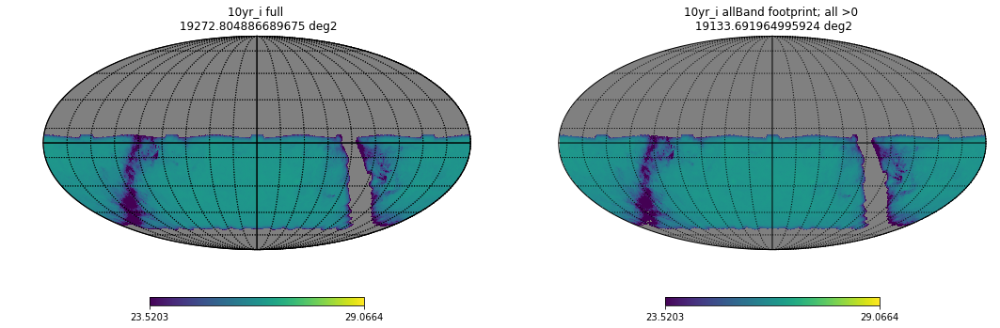

<Figure size 432x288 with 0 Axes>

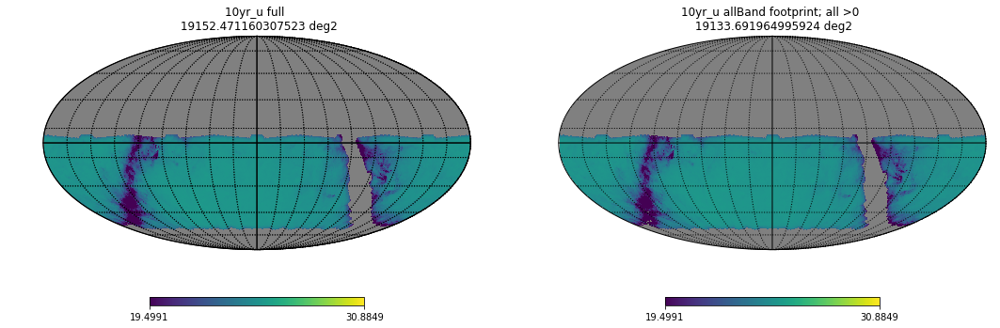

<Figure size 432x288 with 0 Axes>

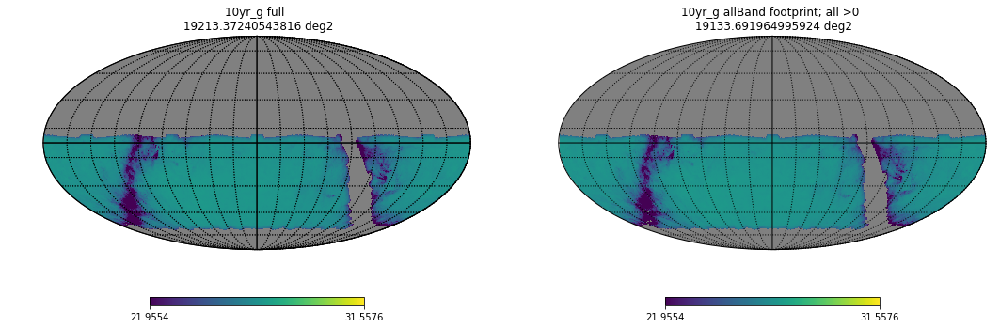

<Figure size 432x288 with 0 Axes>

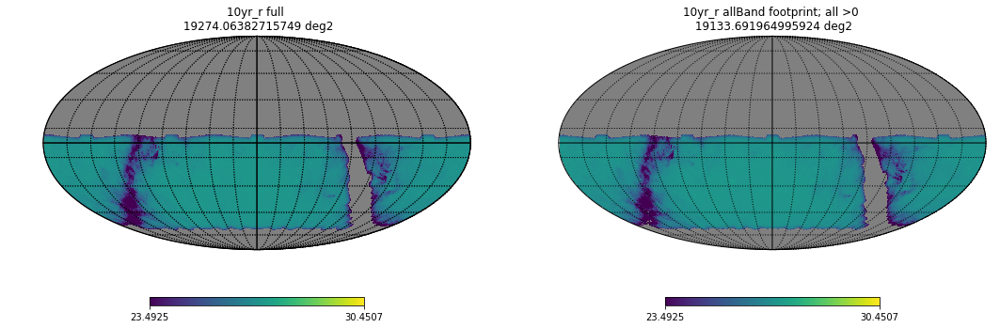

<Figure size 432x288 with 0 Axes>

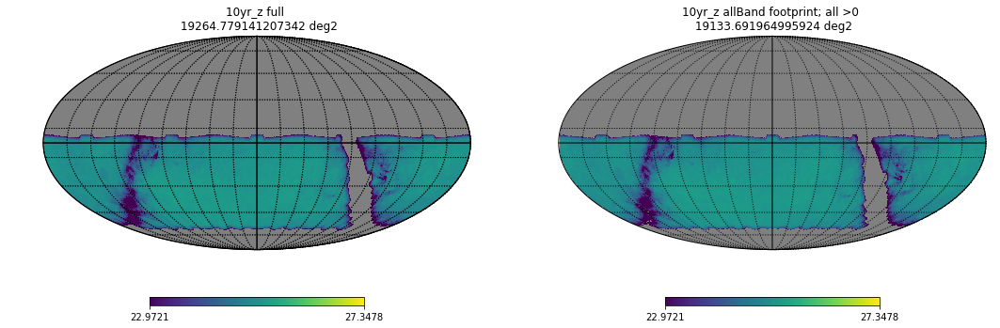

<Figure size 432x288 with 0 Axes>

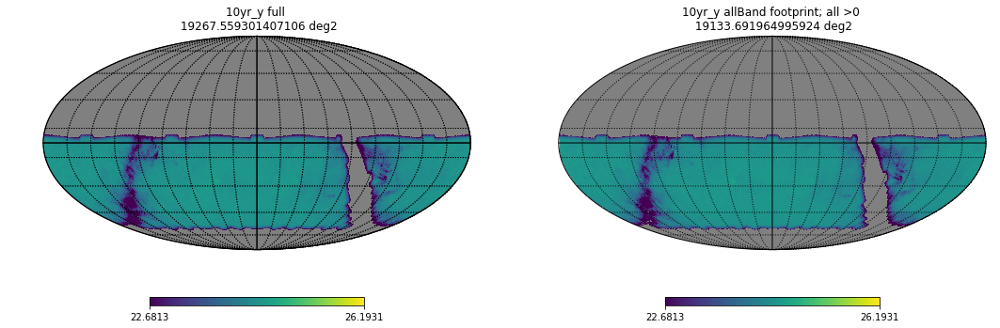

<Figure size 432x288 with 0 Axes>

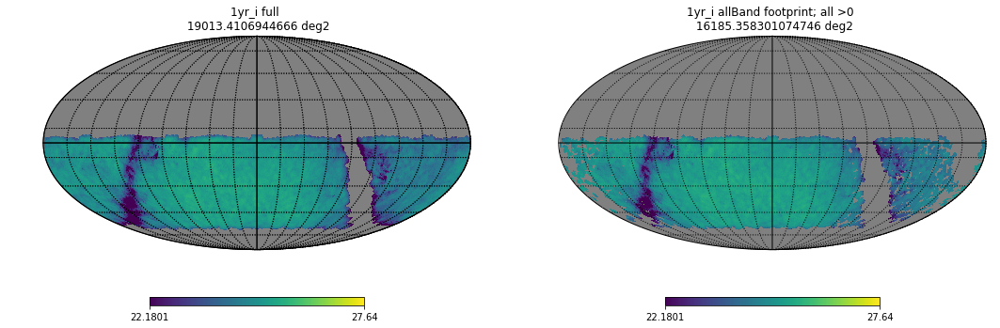

<Figure size 432x288 with 0 Axes>

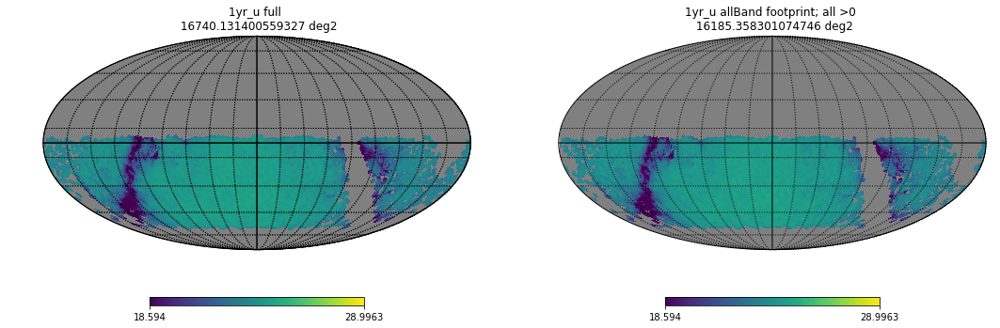

<Figure size 432x288 with 0 Axes>

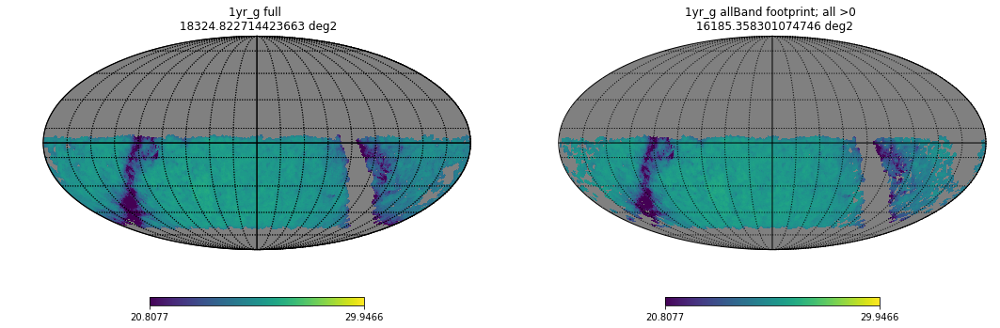

<Figure size 432x288 with 0 Axes>

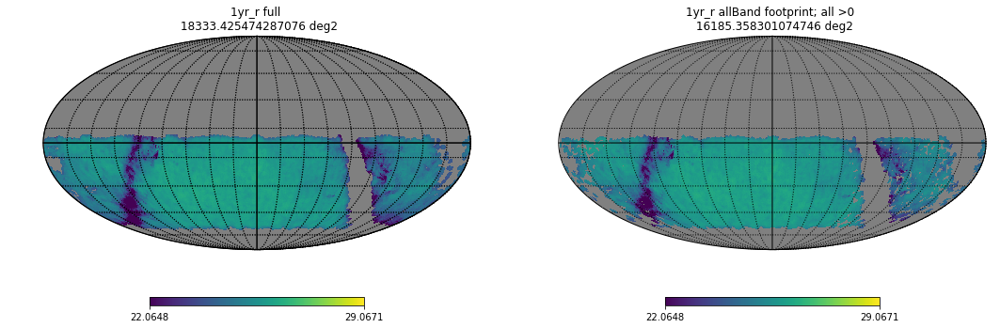

<Figure size 432x288 with 0 Axes>

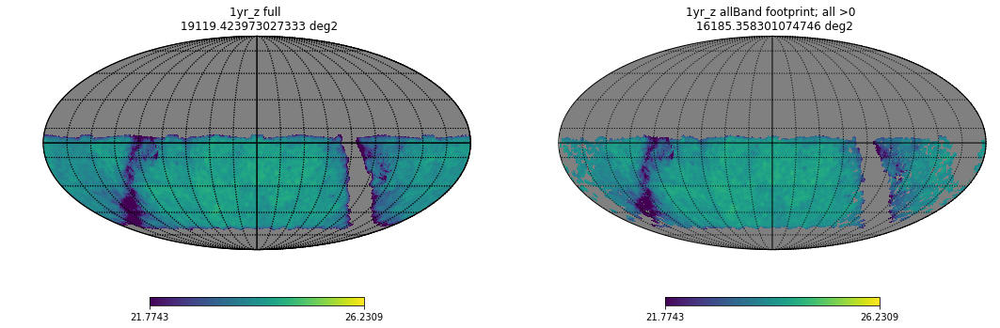

<Figure size 432x288 with 0 Axes>

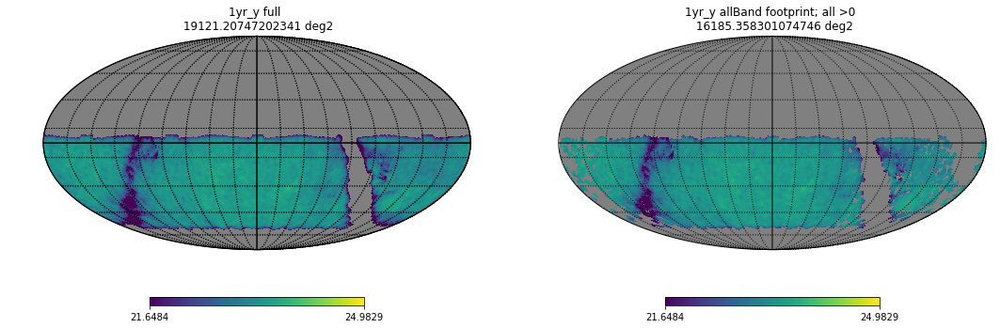

In [14]:
for band in dataMaps.keys():
    inSurveyIndex= np.where(dataMaps[band].mask == False)[0]
    median= np.median(dataMaps[band].data[inSurveyIndex])
    stddev= np.std(dataMaps[band].data[inSurveyIndex])
    colorMin= median-2.5*stddev
    colorMax= median+2.5*stddev
        
    plt.clf()
    fig, axes= plt.subplots(1,2)
    # full survey
    plt.axes(axes[0])
    hp.mollview(dataMaps[band], hold= True,
                min= colorMin, max= colorMax, 
                title= '%s full \n %s deg2'%(band, len(inSurveyIndex)*areaPerPixel),
                flip= 'astro', 
                rot=(0,0,0),cbar=True, )
    hp.graticule(dpar=20, dmer=20, verbose=False)

    # footprint that is common to all six bands
    yrTag= band.split('yr')[0]+'yr'
    
    plt.axes(axes[1])
    newMap= deepcopy(dataMaps[band])
    newMap.mask[:]= True
    newMap.mask[allBandData_Ind[yrTag]]= False

    hp.mollview(newMap, hold= True,
                min= colorMin, max= colorMax, 
                title= '%s allBand footprint; all >0 \n %s deg2'%(band, len(allBandData_Ind[yrTag])*areaPerPixel),
                flip= 'astro', 
                rot=(0,0,0),cbar=True, )
    hp.graticule(dpar=20, dmer=20, verbose=False)

    fig.set_size_inches(18, 18)
    plt.show()

#### For 1yr, u-band is the most restrictive. Also, ~550 deg2 covered in u-band doesnt overlap with the rest of the bands -- could be optimized if u-band cadence is to remain as the most restrictive.

This (^) problem isnt as important for 10yr case: u-band footprint is still the most restrictive but only ~20deg2 covered in u-band is not covered in the rest.

In [15]:
def stats(arr):
    # function to reutrn min, max, mean, median, std, inter-quartile range in the given array
    return [np.nanmin(arr), np.nanmax(arr) , np.nanmean(arr), np.nanmedian(arr), np.nanstd(arr), iqr(arr)]

Find the stats in 1yr, 10yr data for all six bands, both in the full band-specific footprint and all-band footprint.

In [16]:
allYrData= {}
for yrTag in ['1yr', '10yr']:
    allData= pd.DataFrame(OrderedDict(), index= ['min', 'max', 'mean', 'median', 'std', 'iqr', 'coverage'])
    for key in dataMaps:
        if key.__contains__(yrTag):
            # stats on the full inSurvey region
            inSurveyIndex= np.where(dataMaps[key].mask == False)[0]
            data= stats(dataMaps[key].data[inSurveyIndex])
            coverage= len(inSurveyIndex)*areaPerPixel
            data= np.hstack([data, coverage])
            # add to df
            kwargs = {key : data}
            allData= allData.assign(**kwargs)
            
            # common
            coverage= len(allBandData_Ind[yrTag])*areaPerPixel
            data= stats(dataMaps[key].data[allBandData_Ind[yrTag]])
            data= np.hstack([data, coverage])
            # add to df
            colName= "***%s all-Band footprint; all > 0"%(key)
            kwargs = {colName: data}
            allData= allData.assign(**kwargs)
                 
    display(allData)
    allYrData[yrTag]= allData

,1yr_i,***1yr_i all-Band footprint; all > 0,1yr_u,***1yr_u all-Band footprint; all > 0,1yr_g,***1yr_g all-Band footprint; all > 0,1yr_r,***1yr_r all-Band footprint; all > 0,1yr_z,***1yr_z all-Band footprint; all > 0,1yr_y,***1yr_y all-Band footprint; all > 0
min,-152.821969,14.087266,-372.342524,0.031264,-304.098713,5.543241,-205.216609,11.512547,-111.433549,15.368754,-78.555655,16.191196
max,25.773374,25.773374,24.975136,24.975136,26.502077,26.502077,26.513315,26.513315,24.821331,24.821331,23.886662,23.886662
mean,24.654289,24.766918,23.321441,23.357797,24.939919,25.041909,25.216401,25.359362,23.793343,23.880487,23.146302,23.218989
median,24.910058,25.004494,23.795161,23.833998,25.377166,25.455150,25.565945,25.662881,24.002597,24.044798,23.315667,23.343817
std,1.091976,0.780776,2.080454,1.644171,1.827769,1.333911,1.400463,0.984995,0.891319,0.619121,0.666890,0.440775
iqr,0.798986,0.716107,1.187271,1.162030,0.966965,0.885678,1.008973,0.826361,0.501918,0.464225,0.348351,0.306374
coverage,19013.410694,16185.358301,16740.131401,16185.358301,18324.822714,16185.358301,18333.425474,16185.358301,19119.423973,16185.358301,19121.207472,16185.358301


,10yr_i,***10yr_i all-Band footprint; all > 0,10yr_u,***10yr_u all-Band footprint; all > 0,10yr_g,***10yr_g all-Band footprint; all > 0,10yr_r,***10yr_r all-Band footprint; all > 0,10yr_z,***10yr_z all-Band footprint; all > 0,10yr_y,***10yr_y all-Band footprint; all > 0
min,-151.772211,14.286373,-370.554687,0.069105,-302.896167,5.534278,-204.021438,11.916446,-109.806659,15.572702,-77.481776,17.053497
max,26.679740,26.679740,25.757250,25.757250,27.235859,27.235859,27.382168,27.382168,25.530116,25.530116,24.773968,24.773968
mean,25.958764,25.990043,24.570175,24.598613,26.220663,26.254562,26.563560,26.599477,24.910296,24.937027,24.213680,24.237804
median,26.293357,26.295178,25.192003,25.192493,26.756480,26.758179,26.971586,26.973751,25.159962,25.161463,24.437206,24.438225
std,1.109205,0.839882,2.277151,1.715268,1.920448,1.438881,1.391644,1.044596,0.875150,0.667873,0.702356,0.540690
iqr,0.408970,0.393926,0.735090,0.732120,0.629674,0.616227,0.489916,0.471217,0.331439,0.321945,0.247627,0.237840
coverage,19272.804887,19133.691965,19152.471160,19133.691965,19213.372405,19133.691965,19274.063827,19133.691965,19264.779141,19133.691965,19267.559301,19133.691965


Plot i-band histograms to see whats happens to the area converage with depth.

Tot area in the counts: 19133.69196499592 deg2


<Figure size 432x288 with 0 Axes>

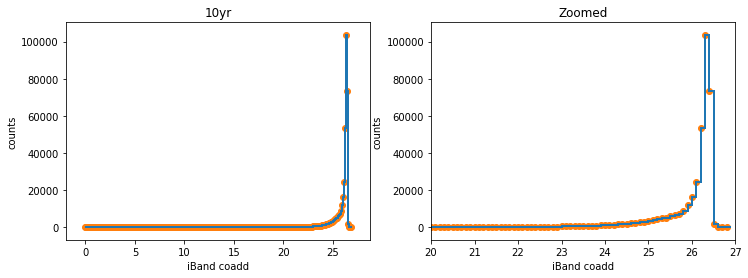

<Figure size 432x288 with 0 Axes>

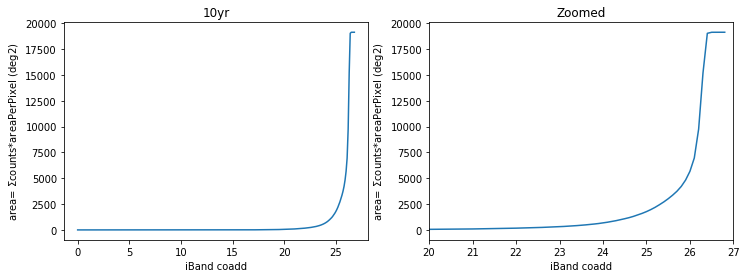

Tot area in the counts: 16185.358301074746 deg2


<Figure size 432x288 with 0 Axes>

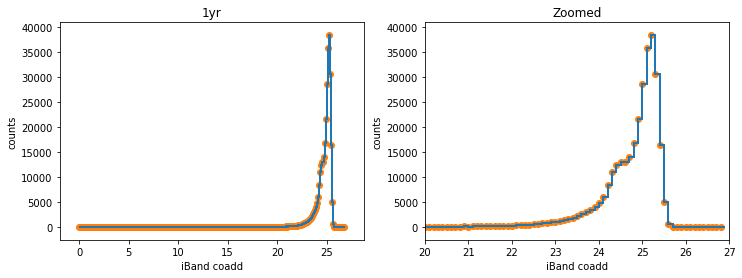

<Figure size 432x288 with 0 Axes>

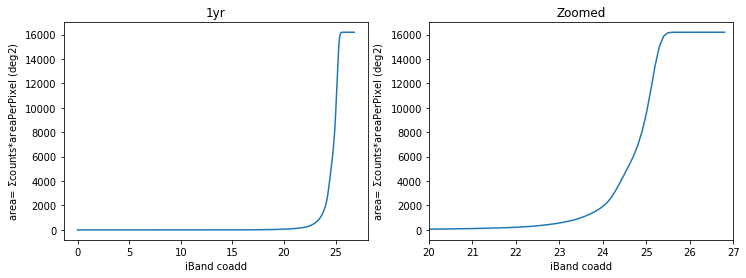

In [17]:
for yrTag in allYrData:
    # counts vs. coadd
    # focus on the 0-27 mag distribution.
    plt.clf()
    fig, axes= plt.subplots(1,2)
    ax=axes[0]
    counts, bins, eh= ax.hist(dataMaps[yrTag+'_i'].data[allBandData_Ind[yrTag]], 
                               bins= np.arange(0., 27, 0.1), histtype= 'step', lw= 2)
    ax.scatter(bins[0:-1], counts)
    ax.set_xlabel('iBand coadd')
    ax.set_ylabel('counts')
    ax.set_title(yrTag)
    print('Tot area in the counts: %s deg2'%sum(counts*areaPerPixel))

    ax=axes[1]
    countsZoomed, binsZoomed, eh= ax.hist(dataMaps[yrTag+'_i'].data[allBandData_Ind[yrTag]], 
                               bins= np.arange(0., 27, 0.1), histtype= 'step', lw= 2)
    ax.scatter(binsZoomed[0:-1], countsZoomed)
    ax.set_xlabel('iBand coadd')
    ax.set_ylabel('counts')
    ax.set_title('Zoomed')
    ax.set_xlim(20,27)
    fig.set_size_inches(12, 4)
    plt.show()
    
    # cumulative area vs. coadd
    plt.clf()
    fig, axes= plt.subplots(1,2)
    ax=axes[0]
    ax.plot(bins[0:-1], np.cumsum(counts*areaPerPixel))
    ax.set_xlabel('iBand coadd')
    ax.set_ylabel('area= $\Sigma$counts*areaPerPixel (deg2)')
    ax.set_title(yrTag)

    ax=axes[1]
    ax.plot(bins[0:-1], np.cumsum(counts*areaPerPixel))
    ax.set_xlabel('iBand coadd')
    ax.set_ylabel('area= $\Sigma$counts*areaPerPixel (deg2)')
    ax.set_title('Zoomed')
    ax.set_xlim(20,27)
    
    fig.set_size_inches(12, 4)
    plt.show()

Implement depth cuts in i-band and calculate stats in all bands in the depth-limit region in the all-band footprint.

In [18]:
iCutPixels= {}   # store the good pixel indices for plotting later.
lowCuts= {'1yr': [23., 24.0], '10yr': [24.5, 25.0],}

for yrTag in lowCuts:
    iCutPixels[yrTag]= {}
    # print out stats for all-band, no cut for reference.
    prevData= allYrData[yrTag]
    cols= [x for x in prevData.keys() if (x.__contains__('***') ) ]
    display(prevData[cols])
    
    # run over different cuts
    for lowCut in lowCuts[yrTag]:
        allData= pd.DataFrame(OrderedDict(), index= ['min', 'max', 'mean', 'median', 'std', 'iqr', 'coverage'])
        
        bandKeys= [yrTag+'_'+x for x in orderBand] # want to maintain i ugrzy order.
        iBandKey= [b for b in bandKeys if b.__contains__('i')][0]  # select out the i-band key
        
        # find the pixels satisfying the iBand cut.
        iBandCutInd= np.where((dataMaps[iBandKey].data[allBandData_Ind[yrTag]]>=lowCut))[0]
        iCutPixels[yrTag][lowCut]= np.array(allBandData_Ind[yrTag])[iBandCutInd] # store
        # calculate the stats
        data= stats(dataMaps[iBandKey].data[allBandData_Ind[yrTag]][iBandCutInd])
        coverage= len(iBandCutInd)*areaPerPixel
        data= np.hstack([data, coverage])
        # add to df
        colName= "**%s_i : i>%s in allBand footprint"%(yrTag, lowCut)
        kwargs = {colName: data}
        allData= allData.assign(**kwargs)
        
        # run over the rest of the bands
        otherBands= bandKeys[1::]
        for band in otherBands:
            data= stats(dataMaps[band].data[allBandData_Ind[yrTag]][iBandCutInd])
            coverage= len(iBandCutInd)*areaPerPixel
            data= np.hstack([data, coverage])
            # add to df
            colName= "**%s : i>%s in allBand footprint"%(band, lowCut)
            kwargs = {colName: data}
            allData= allData.assign(**kwargs)

        display(allData) #[cols])
        
        # add to the df? 
        # need to check the columns dont exist (problematic if re-run only the current cell without initiating the df)
        prev= allYrData[yrTag]
        alreadyExists= False
        for colKey in allData.keys(): 
            if colKey in prev.keys(): alreadyExists= True
        if alreadyExists: print('Not adding data for %s: i>%s; column already exists?'%(yrTag, lowCut))
        else:
            allYrData[yrTag]= prev.join(allData)
    print('-------------- -------------- -------------- -------------- -------------- --------------' )
    print('-------------- -------------- -------------- -------------- -------------- --------------' )

,***10yr_i all-Band footprint; all > 0,***10yr_u all-Band footprint; all > 0,***10yr_g all-Band footprint; all > 0,***10yr_r all-Band footprint; all > 0,***10yr_z all-Band footprint; all > 0,***10yr_y all-Band footprint; all > 0
min,14.286373,0.069105,5.534278,11.916446,15.572702,17.053497
max,26.679740,25.757250,27.235859,27.382168,25.530116,24.773968
mean,25.990043,24.598613,26.254562,26.599477,24.937027,24.237804
median,26.295178,25.192493,26.758179,26.973751,25.161463,24.438225
std,0.839882,1.715268,1.438881,1.044596,0.667873,0.540690
iqr,0.393926,0.732120,0.616227,0.471217,0.321945,0.237840
coverage,19133.691965,19133.691965,19133.691965,19133.691965,19133.691965,19133.691965


,**10yr_i : i>24.5 in allBand footprint,**10yr_u : i>24.5 in allBand footprint,**10yr_g : i>24.5 in allBand footprint,**10yr_r : i>24.5 in allBand footprint,**10yr_z : i>24.5 in allBand footprint,**10yr_y : i>24.5 in allBand footprint
min,24.500011,20.848061,23.201681,24.486632,22.374362,21.973466
max,26.679740,25.757250,27.235859,27.382168,25.530116,24.773968
mean,26.143180,24.906711,26.514320,26.789093,25.057350,24.334075
median,26.307230,25.216517,26.778018,26.988394,25.172996,24.445412
std,0.404727,0.787965,0.660104,0.493296,0.342441,0.289526
iqr,0.306718,0.575427,0.478499,0.364560,0.264553,0.182570
coverage,18146.735094,18146.735094,18146.735094,18146.735094,18146.735094,18146.735094


,**10yr_i : i>25.0 in allBand footprint,**10yr_u : i>25.0 in allBand footprint,**10yr_g : i>25.0 in allBand footprint,**10yr_r : i>25.0 in allBand footprint,**10yr_z : i>25.0 in allBand footprint,**10yr_y : i>25.0 in allBand footprint
min,25.000027,21.923507,24.128186,25.113518,23.310683,22.703311
max,26.679740,25.757250,27.235859,27.382168,25.530116,24.773968
mean,26.191129,24.996123,26.590525,26.846898,25.097097,24.367590
median,26.314372,25.230735,26.789454,26.996794,25.180014,24.449617
std,0.317683,0.622700,0.519288,0.388316,0.269300,0.223646
iqr,0.263774,0.501633,0.415848,0.316292,0.238565,0.158399
coverage,17532.319690,17532.319690,17532.319690,17532.319690,17532.319690,17532.319690


-------------- -------------- -------------- -------------- -------------- --------------
-------------- -------------- -------------- -------------- -------------- --------------


,***1yr_i all-Band footprint; all > 0,***1yr_u all-Band footprint; all > 0,***1yr_g all-Band footprint; all > 0,***1yr_r all-Band footprint; all > 0,***1yr_z all-Band footprint; all > 0,***1yr_y all-Band footprint; all > 0
min,14.087266,0.031264,5.543241,11.512547,15.368754,16.191196
max,25.773374,24.975136,26.502077,26.513315,24.821331,23.886662
mean,24.766918,23.357797,25.041909,25.359362,23.880487,23.218989
median,25.004494,23.833998,25.455150,25.662881,24.044798,23.343817
std,0.780776,1.644171,1.333911,0.984995,0.619121,0.440775
iqr,0.716107,1.162030,0.885678,0.826361,0.464225,0.306374
coverage,16185.358301,16185.358301,16185.358301,16185.358301,16185.358301,16185.358301


,**1yr_i : i>23.0 in allBand footprint,**1yr_u : i>23.0 in allBand footprint,**1yr_g : i>23.0 in allBand footprint,**1yr_r : i>23.0 in allBand footprint,**1yr_z : i>23.0 in allBand footprint,**1yr_y : i>23.0 in allBand footprint
min,23.000023,18.183852,20.198982,21.969515,21.132240,21.023576
max,25.773374,24.975136,26.502077,26.513315,24.821331,23.886662
mean,24.864532,23.571810,25.215459,25.483378,23.957898,23.274703
median,25.023065,23.869785,25.476826,25.684222,24.057666,23.352100
std,0.510943,0.984957,0.802822,0.630554,0.401050,0.280600
iqr,0.666175,1.098994,0.805809,0.760163,0.431788,0.283401
coverage,15676.064426,15676.064426,15676.064426,15676.064426,15676.064426,15676.064426


,**1yr_i : i>24.0 in allBand footprint,**1yr_u : i>24.0 in allBand footprint,**1yr_g : i>24.0 in allBand footprint,**1yr_r : i>24.0 in allBand footprint,**1yr_z : i>24.0 in allBand footprint,**1yr_y : i>24.0 in allBand footprint
min,24.000000,20.474585,21.130530,23.365410,21.804225,21.344891
max,25.773374,24.975136,26.502077,26.513315,24.821331,23.886662
mean,24.964684,23.763405,25.376296,25.598738,24.031646,23.324930
median,25.062439,23.943860,25.524007,25.728770,24.086811,23.369034
std,0.375633,0.684966,0.546545,0.476279,0.299472,0.206846
iqr,0.552500,0.933774,0.655283,0.634730,0.372916,0.240785
coverage,14510.128185,14510.128185,14510.128185,14510.128185,14510.128185,14510.128185


-------------- -------------- -------------- -------------- -------------- --------------
-------------- -------------- -------------- -------------- -------------- --------------


#### Want to reduce std, iqr with depth cuts.

Plot the skymaps without mag cuts vs. with cuts.

<Figure size 432x288 with 0 Axes>

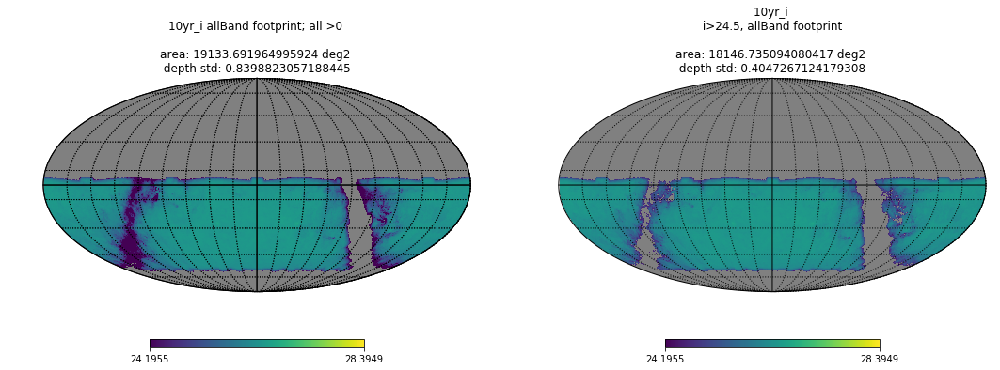

<Figure size 432x288 with 0 Axes>

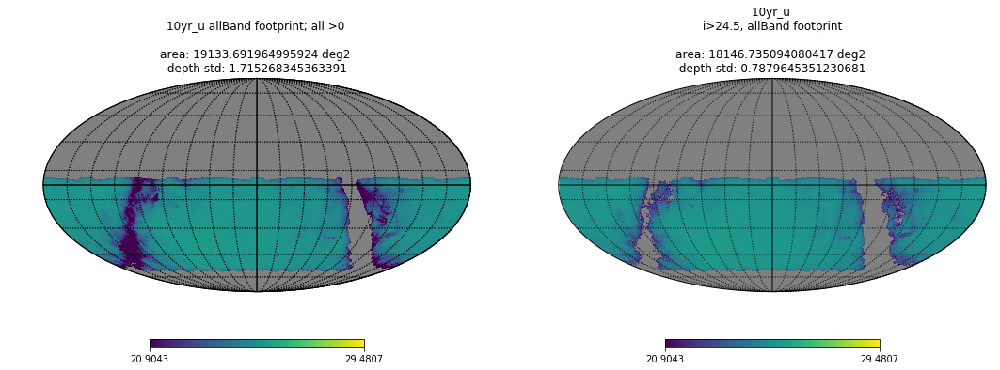

<Figure size 432x288 with 0 Axes>

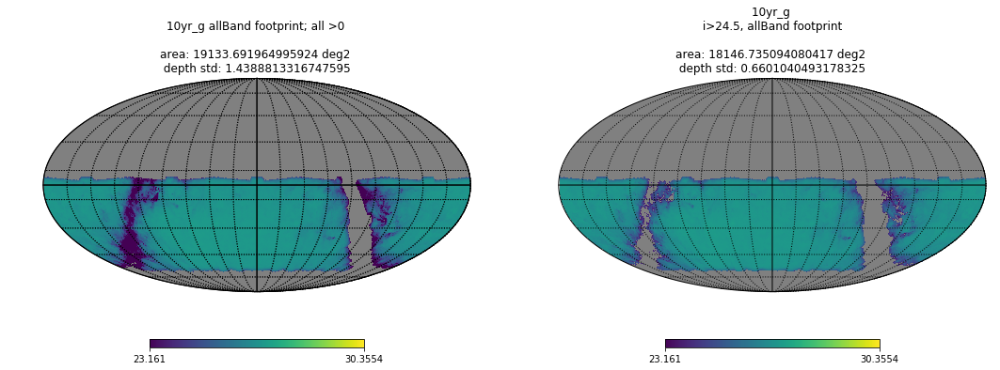

<Figure size 432x288 with 0 Axes>

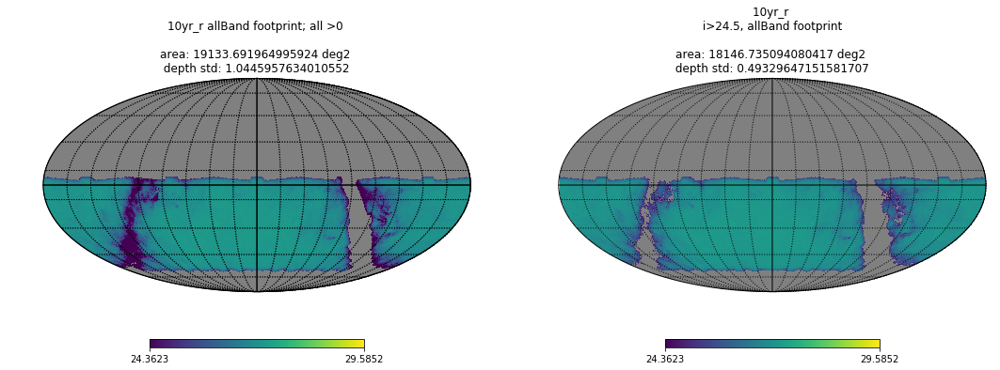

<Figure size 432x288 with 0 Axes>

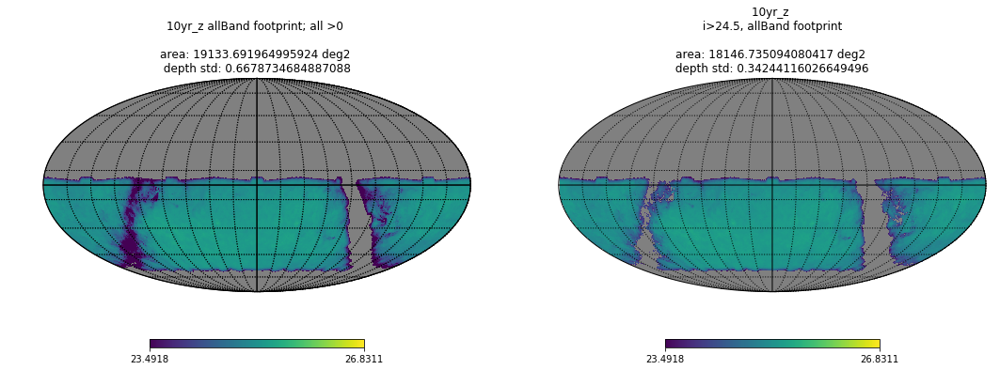

<Figure size 432x288 with 0 Axes>

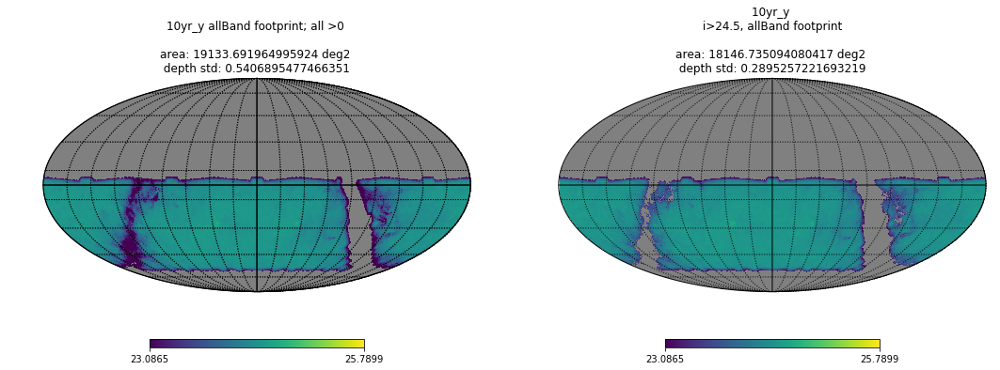

******************* ******************* ******************* ******************* *******************


<Figure size 432x288 with 0 Axes>

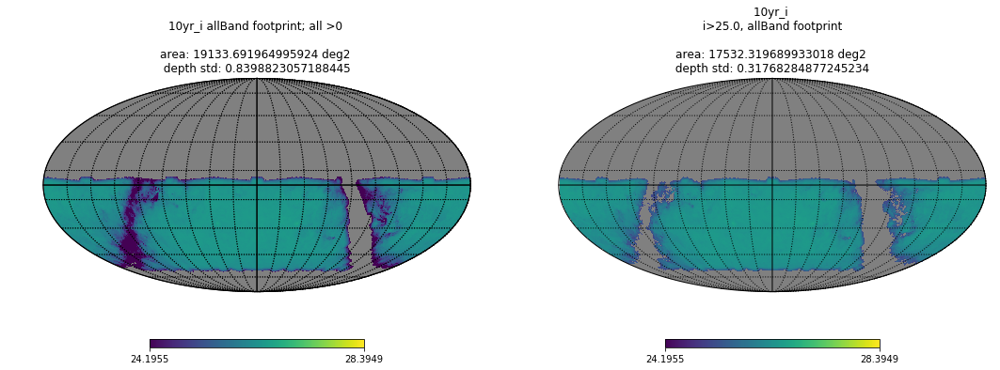

<Figure size 432x288 with 0 Axes>

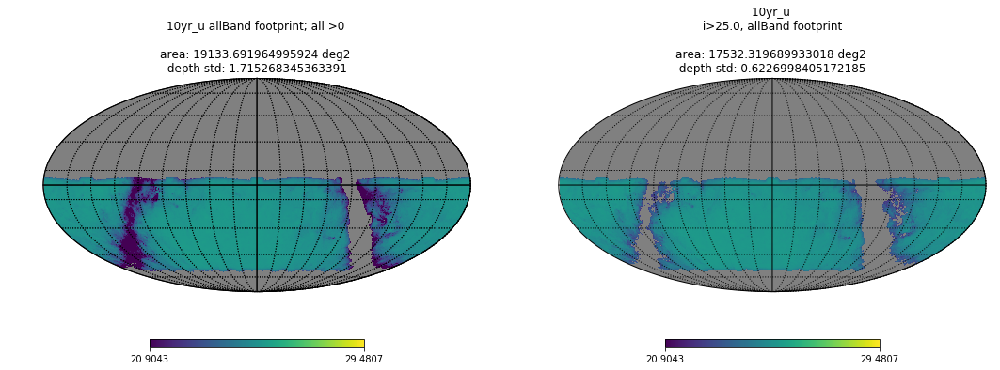

<Figure size 432x288 with 0 Axes>

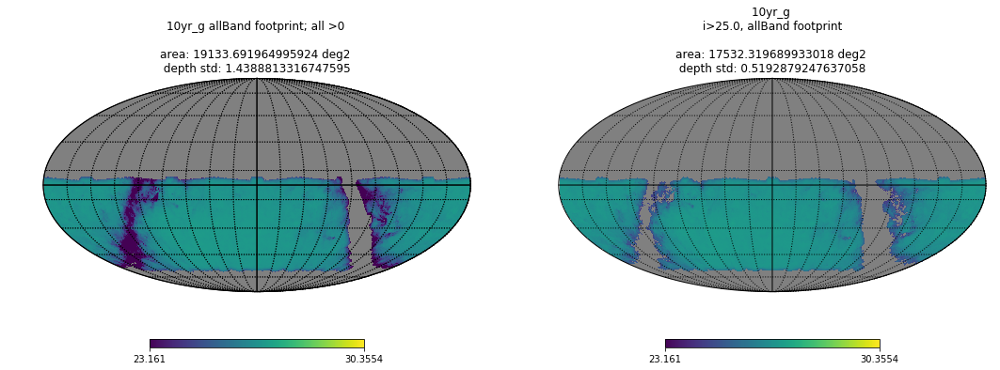

<Figure size 432x288 with 0 Axes>

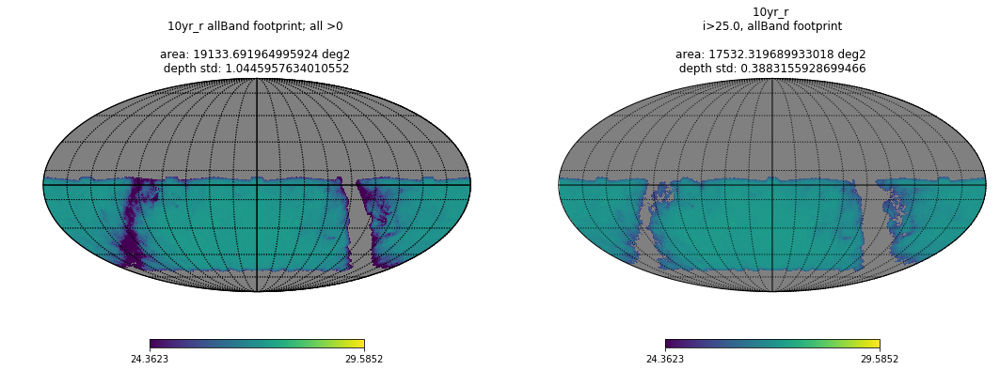

<Figure size 432x288 with 0 Axes>

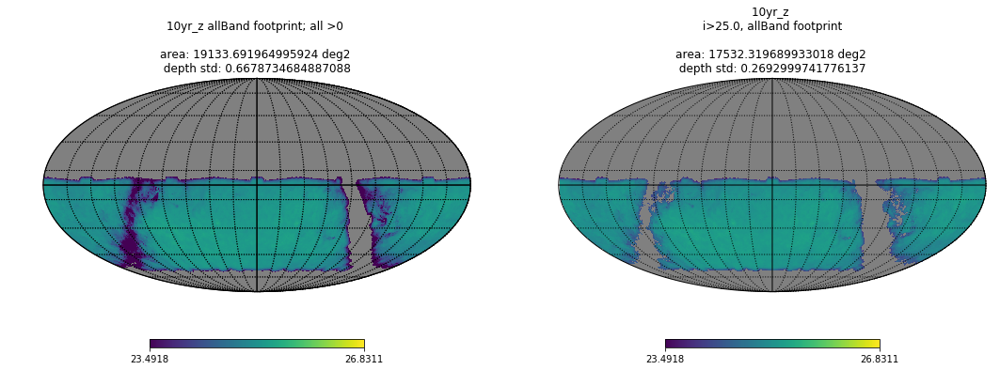

<Figure size 432x288 with 0 Axes>

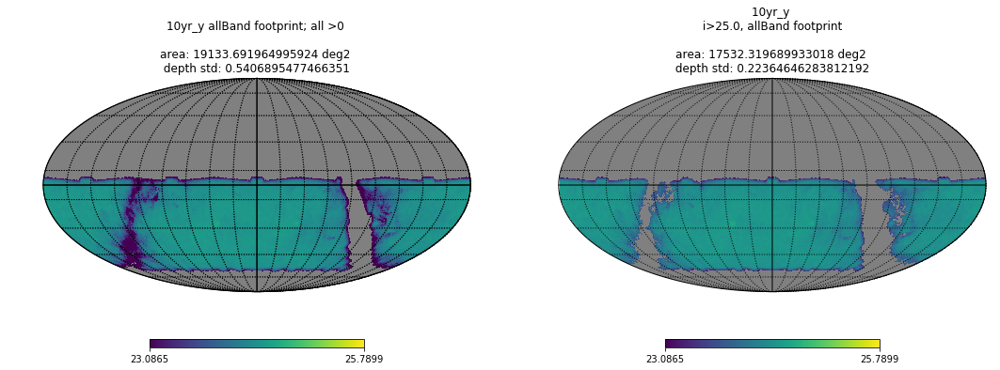

******************* ******************* ******************* ******************* *******************
-------------- -------------- -------------- -------------- -------------- --------------


<Figure size 432x288 with 0 Axes>

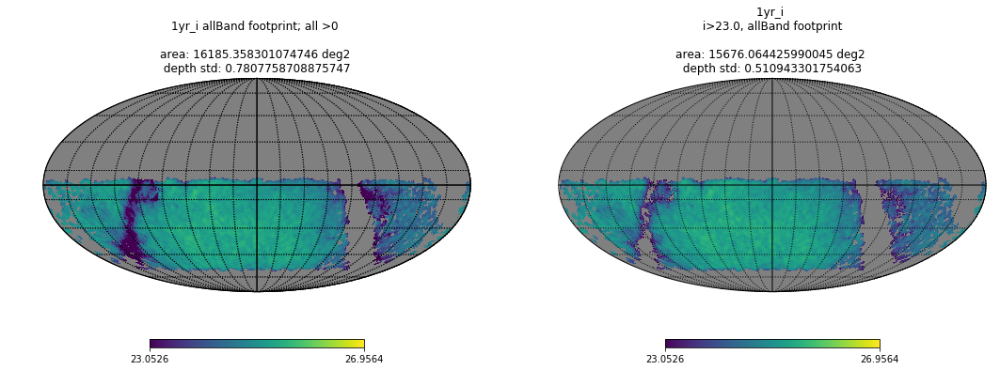

<Figure size 432x288 with 0 Axes>

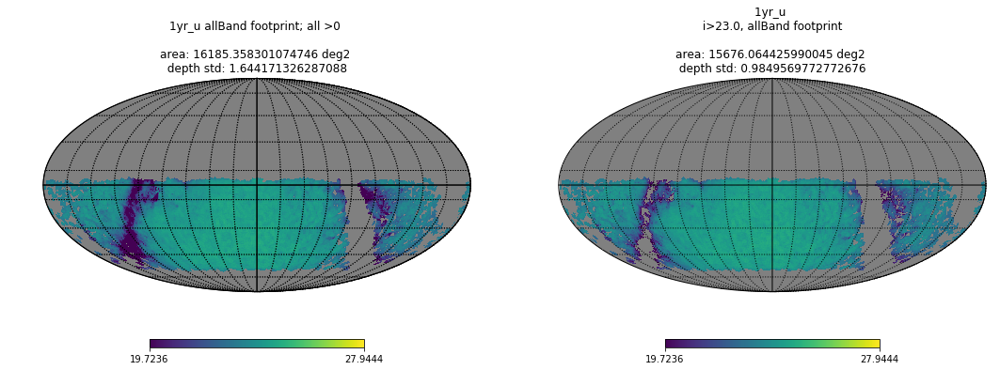

<Figure size 432x288 with 0 Axes>

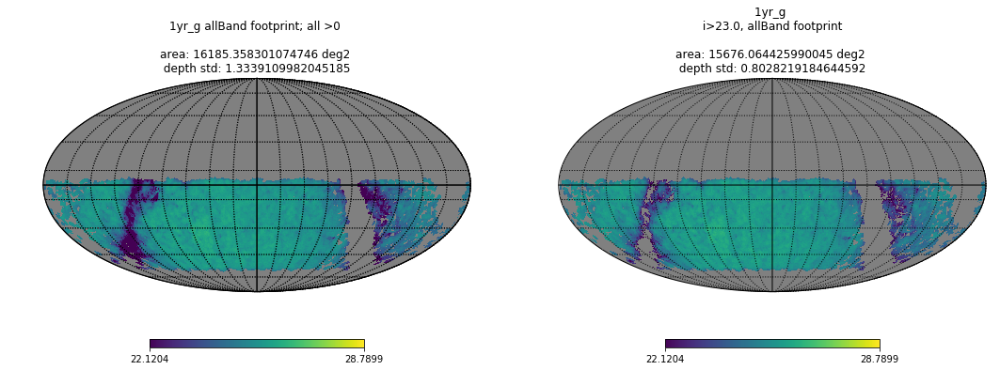

<Figure size 432x288 with 0 Axes>

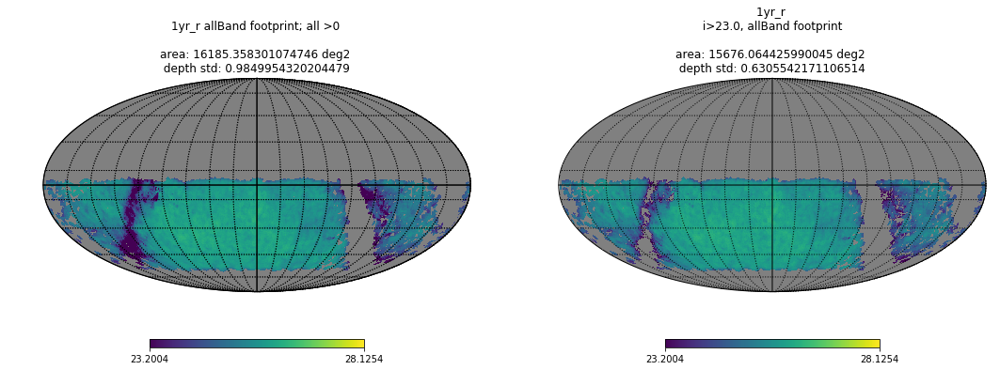

<Figure size 432x288 with 0 Axes>

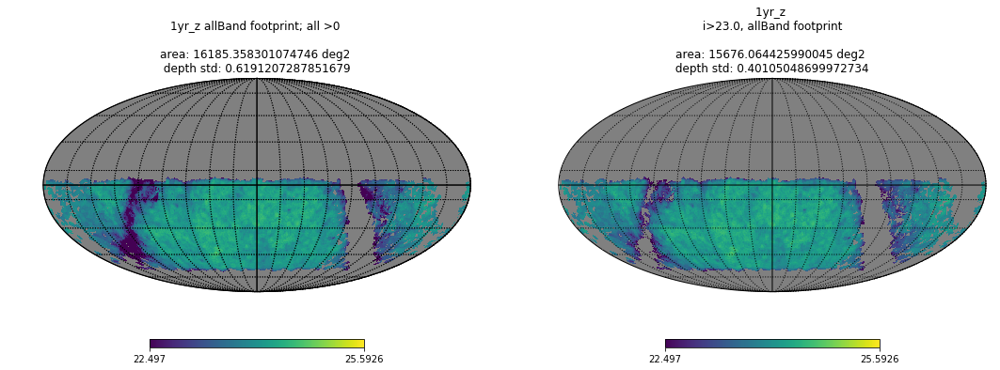

<Figure size 432x288 with 0 Axes>

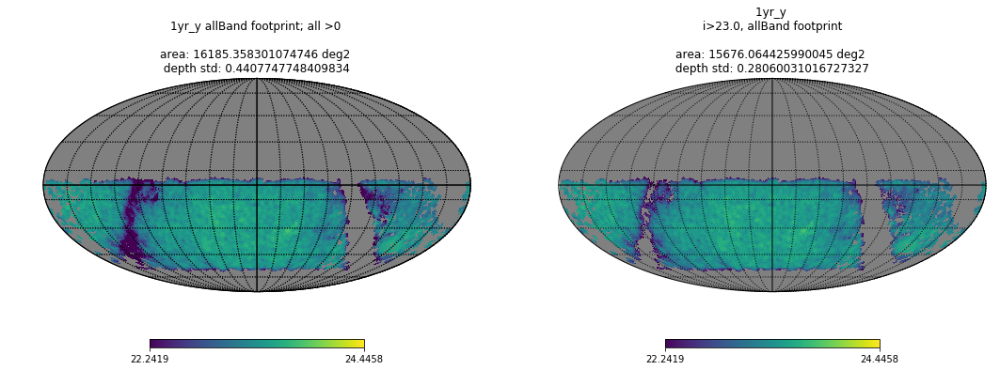

******************* ******************* ******************* ******************* *******************


<Figure size 432x288 with 0 Axes>

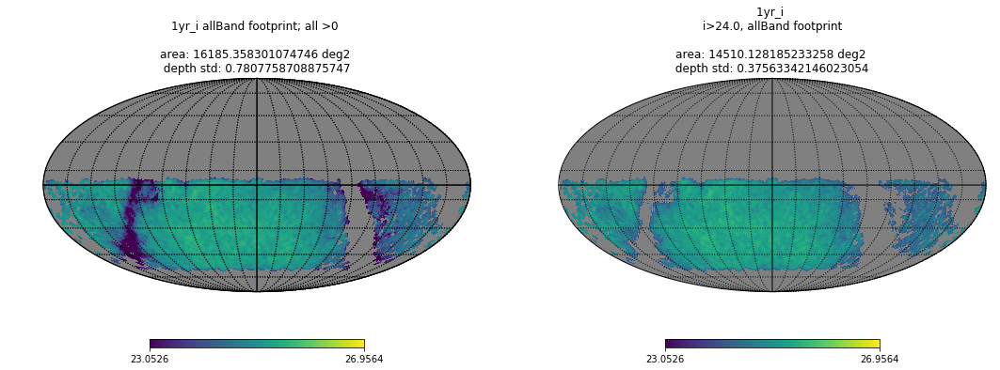

<Figure size 432x288 with 0 Axes>

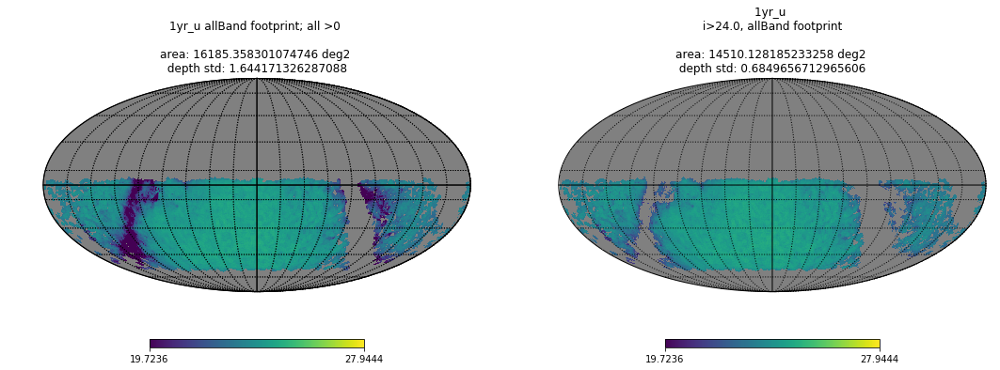

<Figure size 432x288 with 0 Axes>

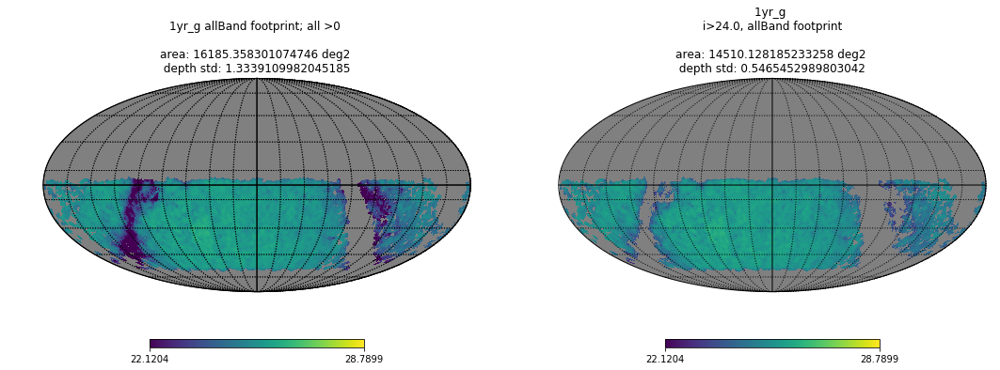

<Figure size 432x288 with 0 Axes>

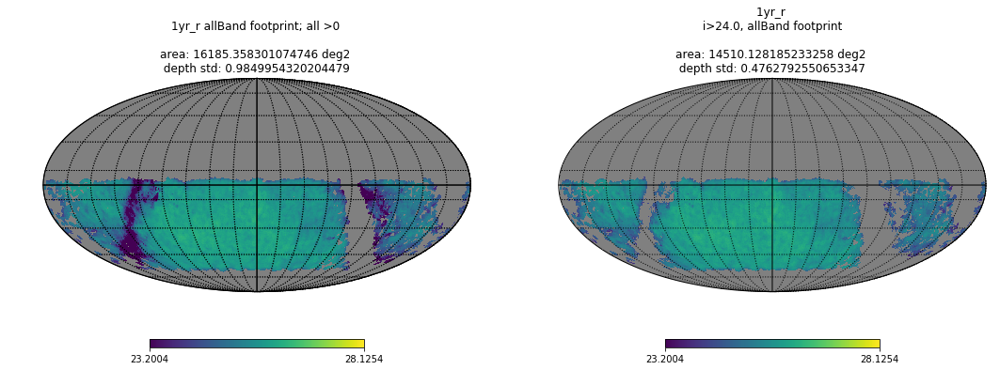

<Figure size 432x288 with 0 Axes>

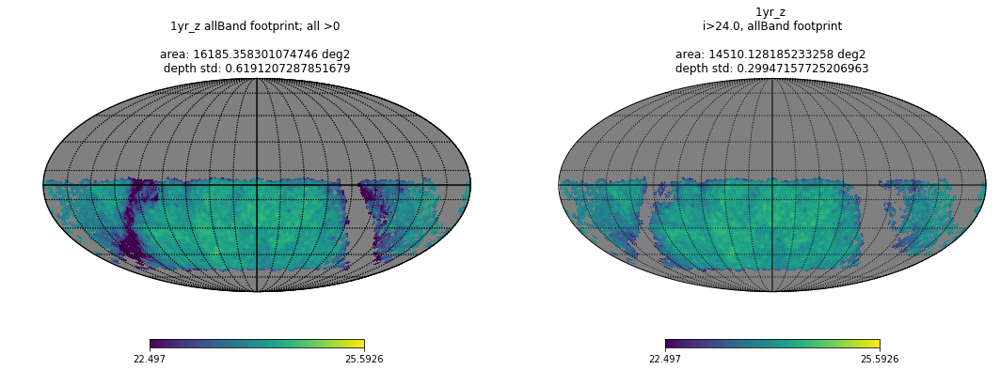

<Figure size 432x288 with 0 Axes>

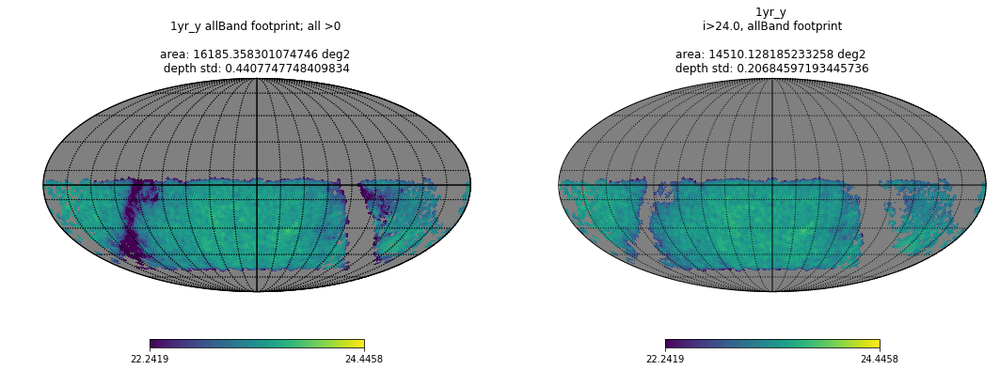

******************* ******************* ******************* ******************* *******************
-------------- -------------- -------------- -------------- -------------- --------------


In [19]:
for yrTag in lowCuts:    
    for lowCut in lowCuts[yrTag]: 
        bandKeys= [yrTag+'_'+x for x in orderBand]
        for band in bandKeys:
            plt.clf()
            fig, axes= plt.subplots(1,2)
            # all-band footprint survey
            newMap= deepcopy(dataMaps[band])
            newMap.mask[:]= True
            newMap.mask[allBandData_Ind[yrTag]]= False
            
            median= np.median(newMap.data[allBandData_Ind[yrTag]])
            stddev= np.std(newMap.data[allBandData_Ind[yrTag]])

            colorMin= median-2.5*stddev
            colorMax= median+2.5*stddev
            
            plt.axes(axes[0])
            title= '%s allBand footprint; all >0 \n\n'%band
            title+= 'area: %s deg2 \n depth std: %s '%(len(allBandData_Ind[yrTag])*areaPerPixel, stddev)
            hp.mollview(newMap, hold= True,
                        min= colorMin, max= colorMax, 
                        title= title,
                        flip= 'astro', 
                        rot=(0,0,0),cbar=True, )
            hp.graticule(dpar=20, dmer=20, verbose=False)

            # iCut-restricted region
            plt.axes(axes[1])
            newMap= deepcopy(dataMaps[band])
            newMap.mask[:]= True
            newMap.mask[iCutPixels[yrTag][lowCut]]= False   # where iband cut is applied

            stddev= np.std(newMap.data[iCutPixels[yrTag][lowCut]])
            
            title= '%s \n i>%s, allBand footprint \n\n'%(band, lowCut)
            title+= 'area: %s deg2 \n depth std: %s '%(len(iCutPixels[yrTag][lowCut])*areaPerPixel, stddev)
            
            hp.mollview(newMap, hold= True,
                        min= colorMin, max= colorMax, 
                        title= title,
                        flip= 'astro', 
                        rot=(0,0,0),cbar=True, )
            hp.graticule(dpar=20, dmer=20, verbose=False)

            fig.set_size_inches(18, 18)
            plt.show()
        print('******************* ******************* ******************* ******************* *******************')
    print('-------------- -------------- -------------- -------------- -------------- --------------')

#### Finalized cuts.

In [20]:
# print out the final columns with only some rows again; as in Out 17.
yr= '1yr'
cols= [x for x in allYrData[yr].keys() if x.__contains__('i>24.0')]
display(allYrData[yr][cols])

# print out the final columns again; as in Out 17.
yr= '10yr'
cols= [x for x in allYrData[yr].keys() if x.__contains__('i>25.0')]
display(allYrData[yr][cols])

,**1yr_i : i>24.0 in allBand footprint,**1yr_u : i>24.0 in allBand footprint,**1yr_g : i>24.0 in allBand footprint,**1yr_r : i>24.0 in allBand footprint,**1yr_z : i>24.0 in allBand footprint,**1yr_y : i>24.0 in allBand footprint
min,24.000000,20.474585,21.130530,23.365410,21.804225,21.344891
max,25.773374,24.975136,26.502077,26.513315,24.821331,23.886662
mean,24.964684,23.763405,25.376296,25.598738,24.031646,23.324930
median,25.062439,23.943860,25.524007,25.728770,24.086811,23.369034
std,0.375633,0.684966,0.546545,0.476279,0.299472,0.206846
iqr,0.552500,0.933774,0.655283,0.634730,0.372916,0.240785
coverage,14510.128185,14510.128185,14510.128185,14510.128185,14510.128185,14510.128185


,**10yr_i : i>25.0 in allBand footprint,**10yr_u : i>25.0 in allBand footprint,**10yr_g : i>25.0 in allBand footprint,**10yr_r : i>25.0 in allBand footprint,**10yr_z : i>25.0 in allBand footprint,**10yr_y : i>25.0 in allBand footprint
min,25.000027,21.923507,24.128186,25.113518,23.310683,22.703311
max,26.679740,25.757250,27.235859,27.382168,25.530116,24.773968
mean,26.191129,24.996123,26.590525,26.846898,25.097097,24.367590
median,26.314372,25.230735,26.789454,26.996794,25.180014,24.449617
std,0.317683,0.622700,0.519288,0.388316,0.269300,0.223646
iqr,0.263774,0.501633,0.415848,0.316292,0.238565,0.158399
coverage,17532.319690,17532.319690,17532.319690,17532.319690,17532.319690,17532.319690


### Some diagnostic plots: before and after cuts

Its important to note that our final cut was based on a magnitude cut in the footprint where *all* bands had data. So essentially we have two cuts, i.e. we have:
- The original coadd data, with no cuts at all. This mean that each band will have to be looked at separately for both 1yr and 10yr data. Label: "no cut"
- Coadd data with just the requirement that all bands have >0 coadd depth => no band-dependency; only yr dependency. Label: "allBand>0"
- Coadd data with magnitude cut in all-band footprint. No band-dependency; only yr dependency. Label: "i>magCut"

#### histogram: galactic latitude
Since have the healpix pixel numbers for pixels before and after cuts, use them to get distribution of corresponding galactic latitude.

In [21]:
# imports needed to get galactic coords from ra, dec
from astropy.coordinates import SkyCoord
from astropy import units as u

In [22]:
def plot_lat_hist(yrTag, lowCut, band, nBins= 20, noBandDependency= False):
    # function to plot a histogram of latitude (declination) before and after the magnitude cut
    print('%s: i>%s'%(yrTag, lowCut))
    
    plt.clf()
    if noBandDependency:
        # work with allBand>0 footprint
        lon, lat= hp.pix2ang(nside= 256, ipix= allBandData_Ind[yrTag], lonlat= True)
        c= SkyCoord(ra= lon*u.degree, dec= lat*u.degree)
        plt.hist(c.galactic.b.degree, label= 'allBand>0', bins= nBins,
                 histtype='step', lw= 2, color='b')
    
    else:
        # work with pixels without any cuts: band dependent
        inSurveyIndex= np.where(dataMaps['%s_%s'%(yrTag, band)].mask == False)[0]
        lon, lat= hp.pix2ang(nside= 256, ipix= inSurveyIndex, lonlat= True)
        c= SkyCoord(ra= lon*u.degree, dec= lat*u.degree)

        plt.hist(c.galactic.b.degree, label= 'no cuts',  bins= nBins,
                 histtype='step', lw= 2, color='b',)
    # work with pixels after cuts
    lon, lat= hp.pix2ang(nside= 256, ipix= iCutPixels[yrTag][lowCut], lonlat= True)
    c= SkyCoord(ra= lon*u.degree, dec= lat*u.degree)
    plt.hist(c.galactic.b.degree, label= 'i > %s; allBand>0'%lowCut, bins= nBins,
             histtype='step', lw= 2, color='r')
    
    plt.gcf().set_size_inches(6, 4)
    if noBandDependency:
        plt.title('%s'%(yrTag), fontsize= 12)
    else:
        plt.title('%s: %s band'%(yrTag, band), fontsize= 12)
    plt.legend(fontsize= 12, bbox_to_anchor=(1.,.7))
    plt.xlabel('Galactic Latitude (degrees)', fontsize= 12)
    plt.show()

1yr: i>24.0


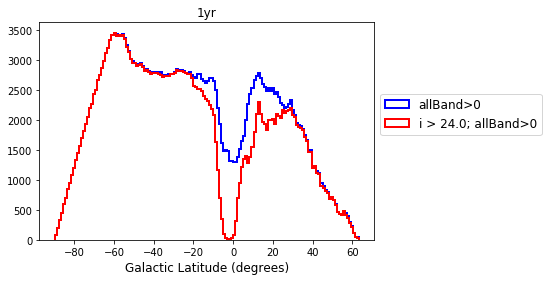

10yr: i>25.0


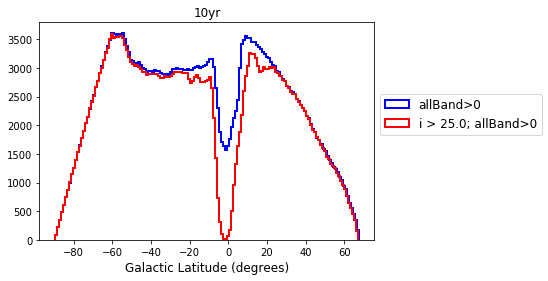

In [23]:
plot_lat_hist('1yr', 24.0, '', nBins= 150, noBandDependency= True)
plot_lat_hist('10yr', 25.0, '', nBins= 150, noBandDependency= True)

### Looks good: out cut is getting rid of pixels near galactic latitude= 0.

1yr: i>24.0


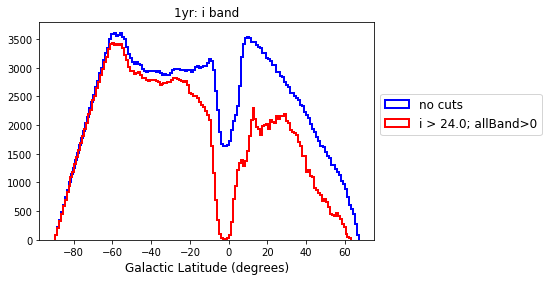

10yr: i>25.0


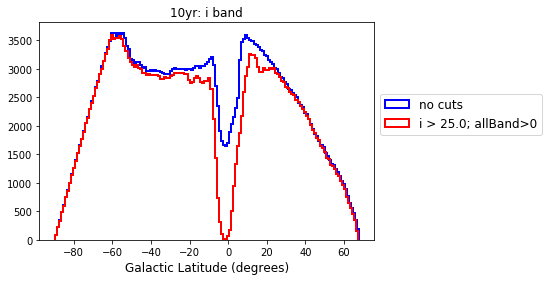

1yr: i>24.0


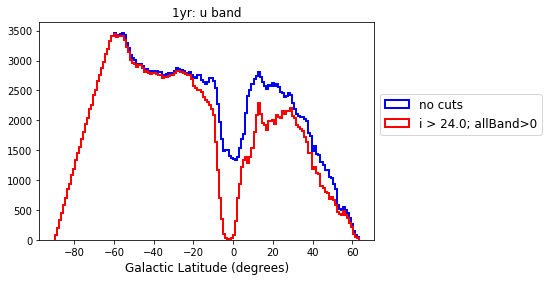

10yr: i>25.0


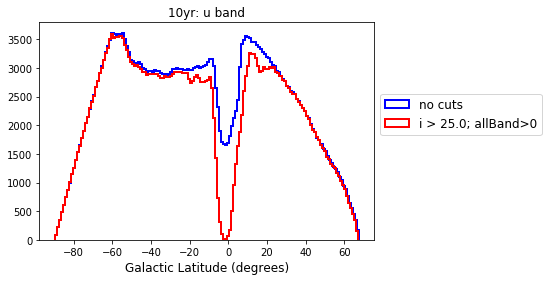

1yr: i>24.0


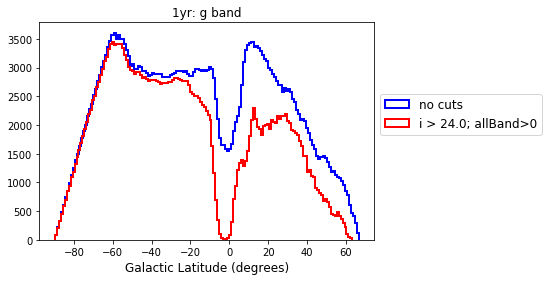

10yr: i>25.0


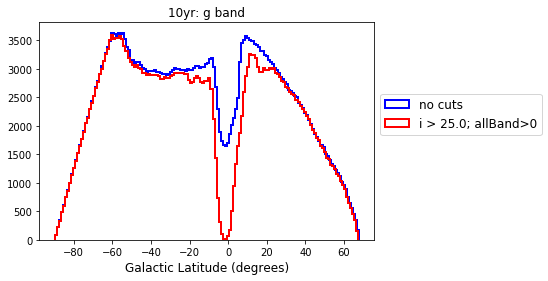

1yr: i>24.0


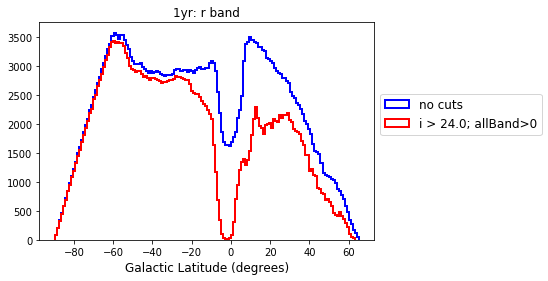

10yr: i>25.0


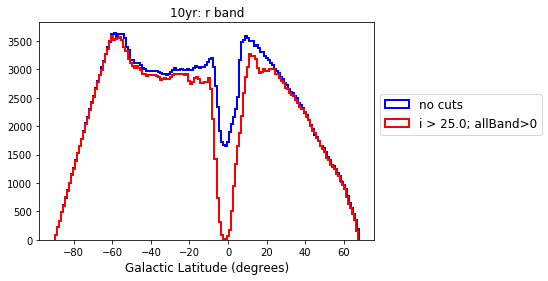

1yr: i>24.0


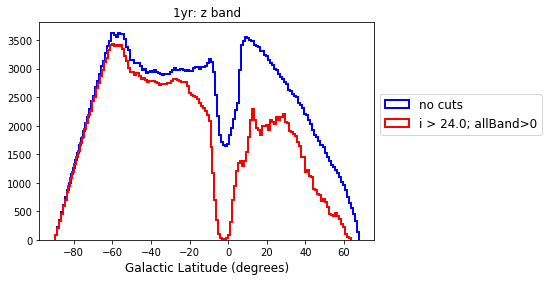

10yr: i>25.0


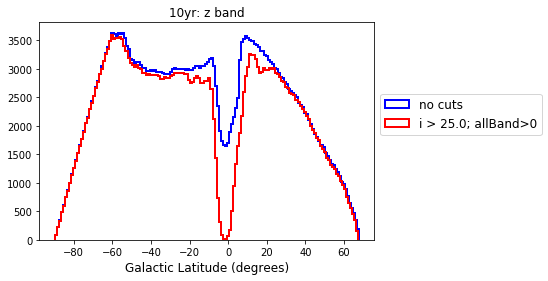

1yr: i>24.0


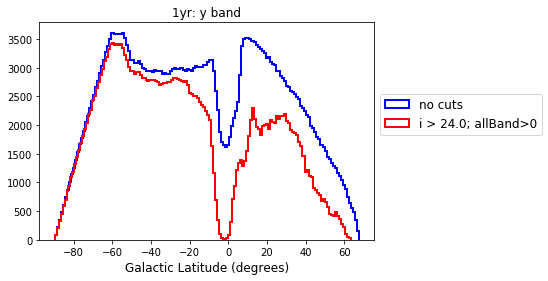

10yr: i>25.0


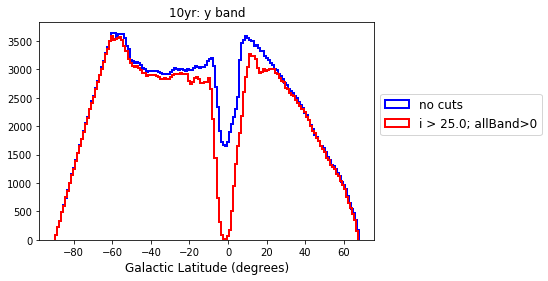

In [24]:
# just to check: look at band-dependent data; no longer looking at region with all-band data present
for band in orderBand:
    plot_lat_hist('1yr', 24.0, band, nBins= 150)
    plot_lat_hist('10yr', 25.0, band, nBins= 150)

Ok good. Different distributions across the bands, but the final cut still does it job.

#### Histogram: extinction, E(B-V)

Cant seem to find a way to just read in the extinction map used in MAF, so downloaded the LAMBDA SFD map from https://lambda.gsfc.nasa.gov/product/foreground/fg_sfd_get.cfm (specifically, the lambda_sfd_ebv.fits file). 
- Since the map has *nested* ordering, need to convert to *ring* as have pixel numbers corresponding to the latter.
- Since the map uses Galactic coordinates, need to convert to equatorial.
- Since the map is at nside= 512, need to downgrade to nside= 256 to use the pixel numbers before/after cuts for the histogram.
After all this, we can use the pixel numbers for before/after cuts, as above for the galactic latitude.

In [25]:
# read in the map
filename= '%s/lambda_sfd_ebv.fits'%dataDir
ebv_map_orig= hp.read_map(filename, nest= True)

NSIDE = 512
ORDERING = NESTED in fits file
INDXSCHM = IMPLICIT


/Users/Humna/.local/lib/python2.7/site-packages/healpy/fitsfunc.py:343: UserWarning: No INDXSCHM keyword in header file : assume IMPLICIT
  "assume {}".format(schm))


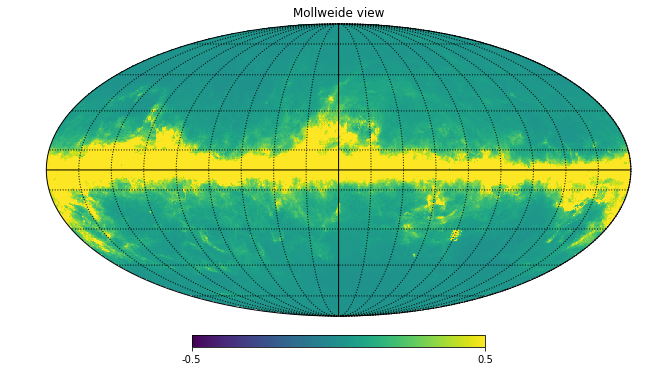

In [26]:
# plot the map: nested ordering, so need to specify in mollview
hp.mollview(ebv_map_orig, flip='astro', rot=(0,0,0), min= -.5, max= .5, nest= True)
hp.graticule(dpar=20, dmer=20, verbose=False)

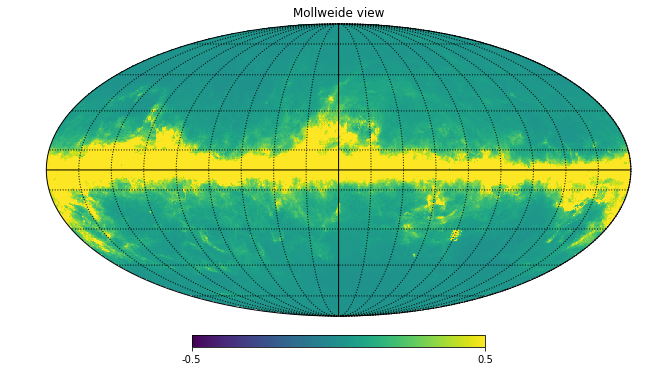

In [27]:
# convert to ring since thats the ordering we have for pixel numbers
ebv_map_ring= hp.pixelfunc.reorder(map_in= ebv_map_orig, n2r= True)

# plot the map
hp.mollview(ebv_map_ring, flip='astro', rot=(0,0,0), min= -.5, max= .5, nest= False)
hp.graticule(dpar=20, dmer=20, verbose=False)

Ok so the galactic plane is horizontal .. not the case for normal MAF skymaps. Checked: LAMBDA map is using galactic coordinates, so need to change to equatorial. Lets plot the coordinate transformation first to confirm this.

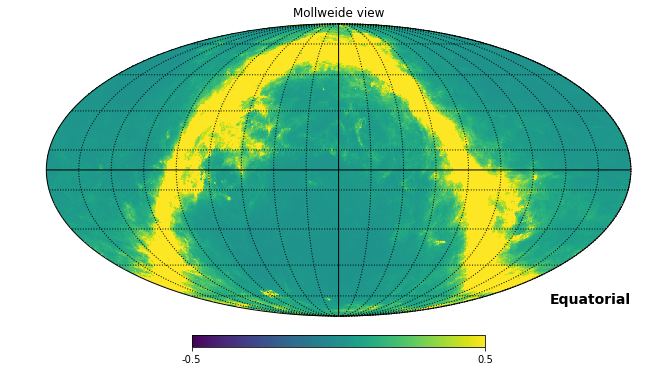

In [28]:
hp.mollview(ebv_map_ring, flip='astro', rot=(0,0,0), min= -.5, max= .5, coord= ['G', 'C'])
hp.graticule(dpar=20, dmer=20, verbose=False)

Ok this looks good, so we want to apply the coordinate transformation to the map. Apparently version 1.12 of healpy has a method to do it, but that version only appears available for linux, so lets just copy/paste source code for the method here.

In [29]:
# method from here: https://github.com/healpy/healpy/blob/master/healpy/rotator.py
from healpy import pixelfunc
def rotate_map(self, m):
        """Rotate a HEALPix map to a new reference frame
        This function first rotates the pixels centers of the new reference
        frame to the original reference frame, then uses hp.get_interp_val
        to interpolate bilinearly the pixel values, finally fixes Q and U
        polarization by the modification to the psi angle caused by
        the Rotator using Rotator.angle_ref.
        Parameters
        ----------
        m : np.ndarray
            Input map, 1 map is considered I, 2 maps:[Q,U], 3 maps:[I,Q,U]
        Returns
        -------
        m_rotated : np.ndarray
            Map in the new reference frame
        """
        if pixelfunc.maptype(m) == 0:  # a single map is converted to a list
            m = [m]
        npix = len(m[0])
        nside = pixelfunc.npix2nside(npix)
        theta_pix_center, phi_pix_center = pixelfunc.pix2ang(
            nside=nside, ipix=np.arange(npix)
        )

        # Rotate the pixels center of the new reference frame to the original frame
        theta_pix_center_rot, phi_pix_center_rot = self.I(
            theta_pix_center, phi_pix_center
        )

        # Interpolate the original map to the pixels centers in the new ref frame
        m_rotated = [
            pixelfunc.get_interp_val(each, theta_pix_center_rot, phi_pix_center_rot)
            for each in m
        ]

        # Rotate polarization
        if len(m_rotated) > 1:
            # Create a complex map from QU  and apply the rotation in psi due to the rotation
            # Slice from the end of the array so that it works both for QU and IQU
            L_map = (m_rotated[-2] + m_rotated[-1] * 1j) * np.exp(
                1j * 2 * self.angle_ref(theta_pix_center, phi_pix_center)
            )

            # Overwrite the Q and U maps with the correct values
            m_rotated[-2] = np.real(L_map)
            m_rotated[-1] = np.imag(L_map)
        else:
            m_rotated = m_rotated[0]

        return m_rotated

Now we can do the coordinate transformation on the map

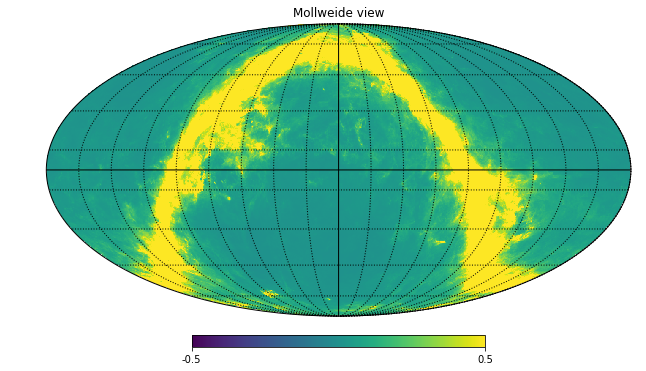

In [30]:
r= hp.rotator.Rotator(coord=['G','C']) # rotator object: G= galactic --> C= equatorial
ebv_map_rot= rotate_map(r, ebv_map_ring)  # rotate the map

# plot it to check
hp.mollview(ebv_map_rot, flip='astro', rot=(0,0,0), min= -.5, max= .5)
hp.graticule(dpar=20, dmer=20, verbose=False)

Ok looks better.

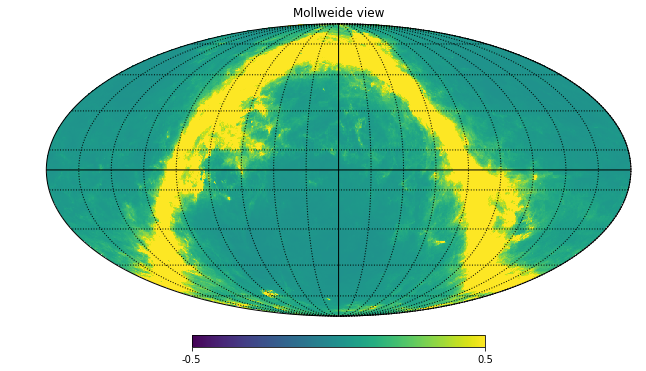

In [31]:
# now downgrade to nside= 256
ebv_map= hp.ud_grade(map_in= ebv_map_rot, nside_out= 256)

# plot to check
hp.mollview(ebv_map, flip='astro', rot=(0,0,0), min= -.5, max= .5)
hp.graticule(dpar=20, dmer=20, verbose=False)

Just to check: set up masked array to mask out things that are dropped after our cuts

In [32]:
ebv_map= ebv_map.view(ma.MaskedArray)
#ebv_.mask= data[key]['mask']
ebv_map.fill_value= np.nan

/Users/Humna/.local/lib/python2.7/site-packages/healpy/pixelfunc.py:304: RuntimeWarning: invalid value encountered in less_equal
  return np.absolute(m - badval) <= atol + rtol * np.absolute(badval)
/Users/Humna/.local/lib/python2.7/site-packages/healpy/projaxes.py:1049: RuntimeWarning: invalid value encountered in less
  result.data[result.data<0]=0.0
/Users/Humna/.local/lib/python2.7/site-packages/healpy/projaxes.py:1050: RuntimeWarning: invalid value encountered in greater
  result.data[result.data>1]=1.0


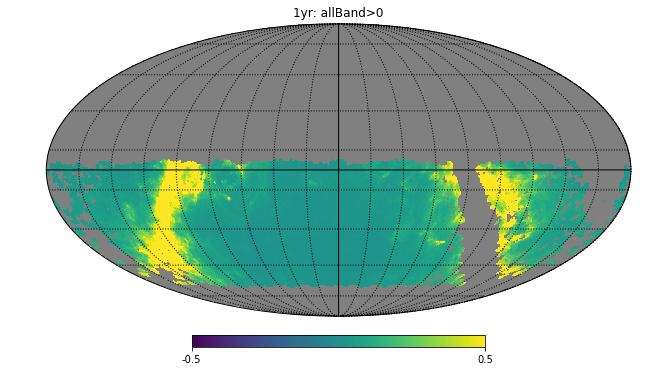

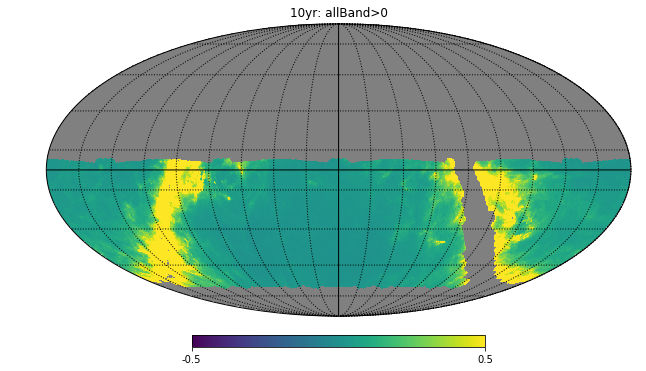

In [33]:
for yrTag in ['1yr', '10yr']:
    ebv_map.mask= [True]*len(ebv_map.data)
    ebv_map.mask[allBandData_Ind[yrTag]]= False

    hp.mollview(ebv_map, flip='astro', rot=(0,0,0), min= -.5, max= .5, title= '%s: allBand>0'%yrTag)
    hp.graticule(dpar=20, dmer=20, verbose=False)
    plt.show()

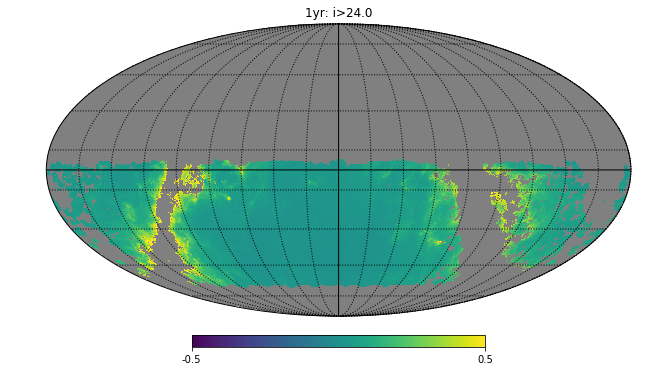

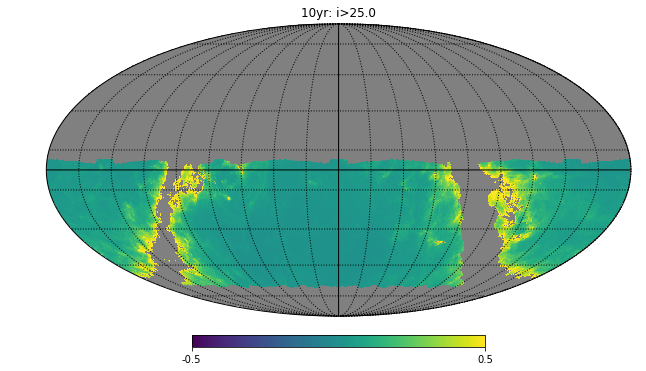

In [34]:
for yrTag, lowCut in [('1yr', 24.0), ('10yr', 25.0)]:
    #print yrTag, lowCut
    ebv_map.mask= [True]*len(ebv_map.data)
    ebv_map.mask[iCutPixels[yrTag][lowCut]]= False

    hp.mollview(ebv_map, flip='astro', rot=(0,0,0), min= -.5, max= .5, title= '%s: i>%s'%(yrTag, lowCut))
    hp.graticule(dpar=20, dmer=20, verbose=False)
    plt.show()

Things look good. Just the allBand>0 requirement isn't enough to get rid of the high-extinction regions. Our magnitude cut is good.

In [35]:
# change masked array to normal array
ebv_map= ebv_map.data

In [36]:
def plot_ebv_hist(yrTag, lowCut, band, nBins= 20, noBandDependency= False, bins= None, xlim= None):
    # function to plot a histogram of latitude (declination) before and after the magnitude cut
    print('%s: i>%s'%(yrTag, lowCut))
    
    if bins is not None: nBins= bins  # in case user inputs bin edges
        
    plt.clf()
    if noBandDependency:
        # work with allBand>0 footprint
        _, bins, _= plt.hist(ebv_map[allBandData_Ind[yrTag]], label= 'allBand>0', bins= nBins,
                             histtype='step', lw= 4, color='b')
    
    else:
        # work with pixels without any cuts: band dependent
        inSurveyIndex= np.where(dataMaps['%s_%s'%(yrTag, band)].mask == False)[0]
        _, bins, _= plt.hist(ebv_map[inSurveyIndex], label= 'no cuts',  bins= nBins,
                             histtype='step', lw= 4, color='b',)
    # work with pixels after cuts
    plt.hist(ebv_map[iCutPixels[yrTag][lowCut]], label= 'i > %s; allBand>0'%lowCut, bins= bins,
             histtype='step', lw= 2, color='r')
    
    plt.gcf().set_size_inches(6, 4)
    if noBandDependency:
        plt.title('%s'%(yrTag), fontsize= 12)
    else:
        plt.title('%s: %s band'%(yrTag, band), fontsize= 12)
    plt.legend(fontsize= 12, loc= "upper right")
    plt.xlabel('E(B-V)', fontsize= 12)
    if xlim is not None: plt.xlim(xlim[0], xlim[1])
    plt.show()

1yr: i>24.0


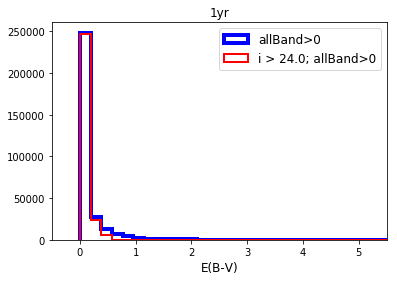

10yr: i>25.0


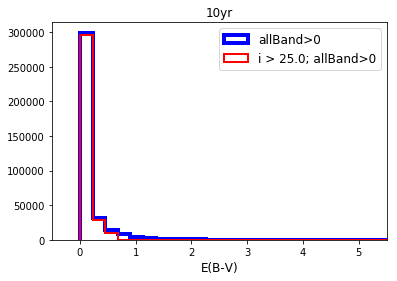

In [37]:
plot_ebv_hist('1yr', 24.0, '', nBins= 40, noBandDependency= True, xlim= [-0.5,5.5])
plot_ebv_hist('10yr', 25.0, '', nBins= 40, noBandDependency= True, xlim= [-0.5,5.5])

Ok good, the high extinction pixels are dropped after the final cut.

1yr: i>24.0


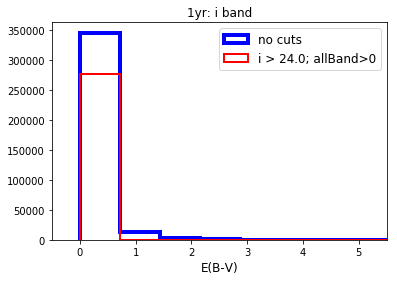

10yr: i>25.0


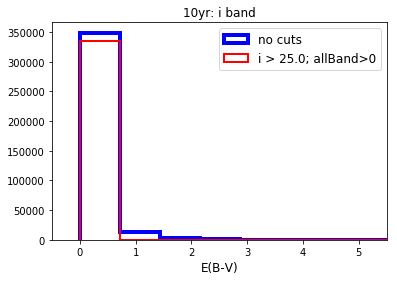

1yr: i>24.0


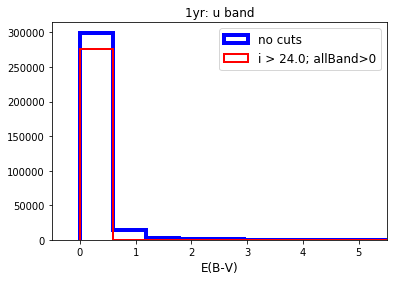

10yr: i>25.0


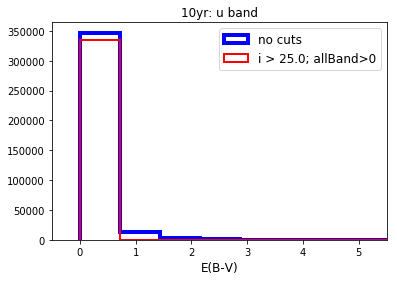

1yr: i>24.0


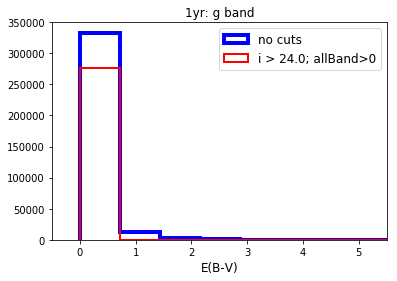

10yr: i>25.0


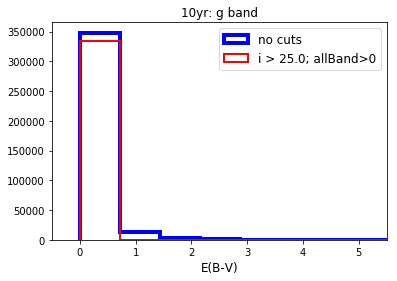

1yr: i>24.0


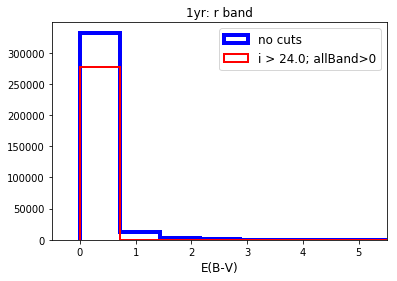

10yr: i>25.0


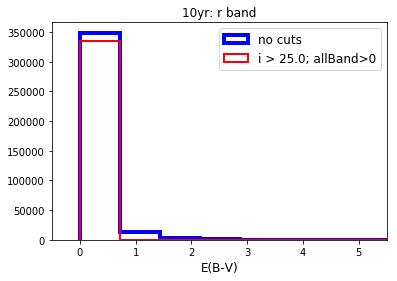

1yr: i>24.0


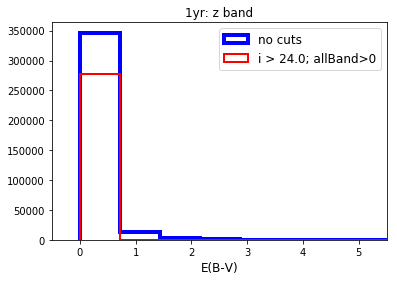

10yr: i>25.0


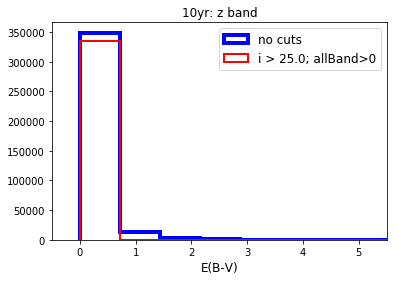

1yr: i>24.0


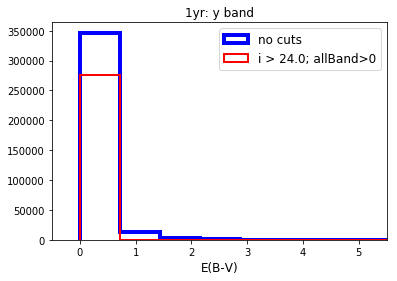

10yr: i>25.0


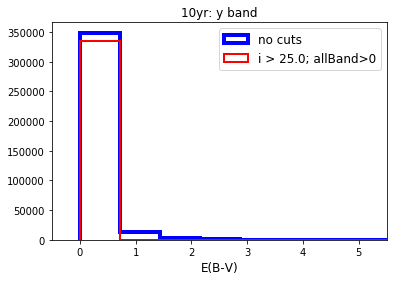

In [38]:
for band in orderBand:
    plot_ebv_hist('1yr', 24.0, band, nBins= 50, xlim= [-0.5,5.5])
    plot_ebv_hist('10yr', 25.0, band, nBins= 50, xlim= [-0.5,5.5])